In [1]:
import set_env  # not included in the repo, defines $PROJECT_DIR, $PNC_PROJECT_DIR, $IMAGEN_PROJECT_DIR & $INPUT_DIR

In [2]:
import sys
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats
import statsmodels.formula.api as smf
import pickle
import statsmodels.stats.multitest
from tqdm import tqdm

OUTPUT_DIR = {
    "pnc": os.path.join(os.environ["PNC_PROJECT_DIR"], "output"),
    "imagen": os.path.join(os.environ["IMAGEN_PROJECT_DIR"], "output"),
    "micamics": os.path.join(os.environ["PROJECT_DIR"], "output", "micamics")
}
INPUT_DIR = os.environ["INPUT_DIR"]
CODE_DIR = os.path.join(os.getcwd(), "..", "scripts")
sys.path.append(CODE_DIR)
from utils import transform, plot, stats 
from modeling.check_fit import *

import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({'font.size': 16, "font.family": "Asana Math", "figure.dpi": 192})
thcolor = '#44546A'
add_text = True # add statistics as text to some figures

/data/project/ei_development/env/lib/python3.10/site-packages/nilearn/input_data/__init__.py:23: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


# Figure 5a. Subject-level with default configurations 

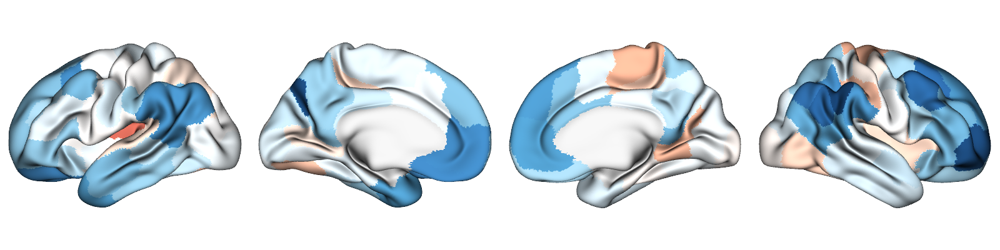

In [122]:
t_age = pd.read_csv('p_pnc_fc-sub_sc-sub_runs-2_IE_age_stats.csv', index_col=0).iloc[:,0]
plot.plot_surface(
    transform.deparcellate_surf(t_age, 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='row',
)

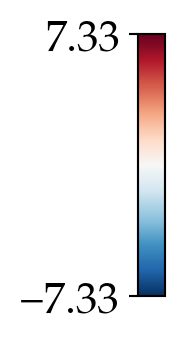

In [5]:
vmin = min(t_age.values.min(), -t_age.values.max())
vmax = -vmin
plot.plot_colorbar(vmin.round(2), vmax.round(2), 'RdBu_r', figsize=(2, 2));

# Figure S8 and 5c. Robustness of the findings to the effect of inter-individual variability of structural connectome

## a. Effect of age on $\langle I_i^E \rangle$ controlled for SC strength

Load individualized models data:

In [46]:
parcels = transform.load_ordered_parcel_labels('schaefer-100')
elig_subs = pd.read_csv(
    os.path.join(INPUT_DIR, "pnc_subs.csv"), index_col=0
).sort_index()

if os.path.exists('pnc_fc-sub_sc-sub_runs-2.csv') & os.path.exists('pnc_fc-sub_sc-sub_runs-2_vars.pkz'):
    subjects_optima = pd.read_csv('pnc_fc-sub_sc-sub_runs-2.csv', index_col=0)
    with open('pnc_fc-sub_sc-sub_runs-2_vars.pkz', 'rb') as f:
        regional_vars = pickle.load(f)
else:
    print("Run Figure 2 first")

best_runs = subjects_optima.groupby("sub")["gof"].idxmax().values
data = subjects_optima.loc[best_runs].set_index("sub")
data[["age", "sex", "group"]] = elig_subs.loc[data.index, ["age", "sex", "group"]]
data["Age (y)"] = data["age"] / 12

# add motion data
motion = pd.read_csv(
    os.path.join(OUTPUT_DIR["pnc"], 'postfmriprep', 'participants.tsv'), 
    delimiter="\t", index_col=0
).loc[data.index]
data = pd.concat([data, motion], axis=1)

In [9]:
I_E = pd.DataFrame(index=data.index, columns=parcels, dtype=float)
for i, parc in enumerate(parcels):
    for sub, row in data.iterrows():
        I_E.loc[sub, parc] = regional_vars[sub][row['SeedMW']].loc[i, 'I_E']

Calculate SC strength:

In [10]:
sc_strength = pd.DataFrame(index=data.index, columns=parcels, dtype=float)
for sub in tqdm(data.index):
    sc = pd.read_csv(
        os.path.join(OUTPUT_DIR['pnc'], 'SC', sub, 
                     'ctx_parc-schaefer-100_mean001_thresh-1_desc-strength.csv.gz'),
        index_col=0)
    sc_strength.loc[sub, :] = sc.sum(axis=1)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 752/752 [00:04<00:00, 157.41it/s]


Calculate age effects while controlling for SC strength:

In [27]:
df = pd.concat([I_E, sc_strength, data], axis=1)
df.columns = [f'IE_{i}' for i in range(100)] + [f'SC_{i}' for i in range(100)] + list(df.columns[200:])
df['sex_int'] = (df['sex'] == 'F').astype('int')

t_age_sc_conf = pd.Series(index=parcels)
p_age_sc_conf = pd.Series(index=parcels)
outliers = {}
for i, parc in enumerate(parcels):
    # exclude outliers
    curr_subs = I_E.index[(scipy.stats.zscore(I_E.loc[:, parc]).abs() < 3)]
    outliers[parc] = set(df.index) - set(curr_subs)
    model_df = df.loc[curr_subs]
    # fit the model
    mod = smf.ols(f'IE_{i} ~ age + gof + sex_int + mean_rms + SC_{i}', data=model_df)
    res = mod.fit()
    t_age_sc_conf.loc[parc] = res.tvalues['age']
    p_age_sc_conf.loc[parc] = res.pvalues['age']

# FDR correction
_, p_age_sc_conf_fdr = statsmodels.stats.multitest.fdrcorrection(p_age_sc_conf)
p_age_sc_conf_fdr = pd.Series(p_age_sc_conf_fdr, index=parcels)

# display stats of signficant regions
stats_age_sc_conf = pd.DataFrame({"t": t_age_sc_conf, "p": p_age_sc_conf, "p_fdr": p_age_sc_conf_fdr})
stats_age_sc_conf[stats_age_sc_conf["p_fdr"] < 0.05].sort_values(by="t").round(3)

,t,p,p_fdr
7Networks_RH_Cont_Par_1,-7.160,0.000,0.000
7Networks_LH_Cont_pCun_1,-7.006,0.000,0.000
7Networks_RH_Cont_PFCl_1,-6.428,0.000,0.000
7Networks_RH_Default_PFCdPFCm_3,-6.374,0.000,0.000
7Networks_RH_Default_Par_1,-6.037,0.000,0.000
7Networks_RH_Cont_PFCl_4,-5.918,0.000,0.000
7Networks_RH_DorsAttn_Post_3,-5.469,0.000,0.000
7Networks_LH_SalVentAttn_ParOper_1,-5.307,0.000,0.000
7Networks_LH_Default_PFC_3,-5.269,0.000,0.000
7Networks_LH_Default_PFC_7,-5.194,0.000,0.000


In [28]:
stats_age_sc_conf.to_csv("p_pnc_fc-sub_sc-sub_runs-2_IE_age_sc_conf_stats.csv")

Plot unthresholded (5c-left):

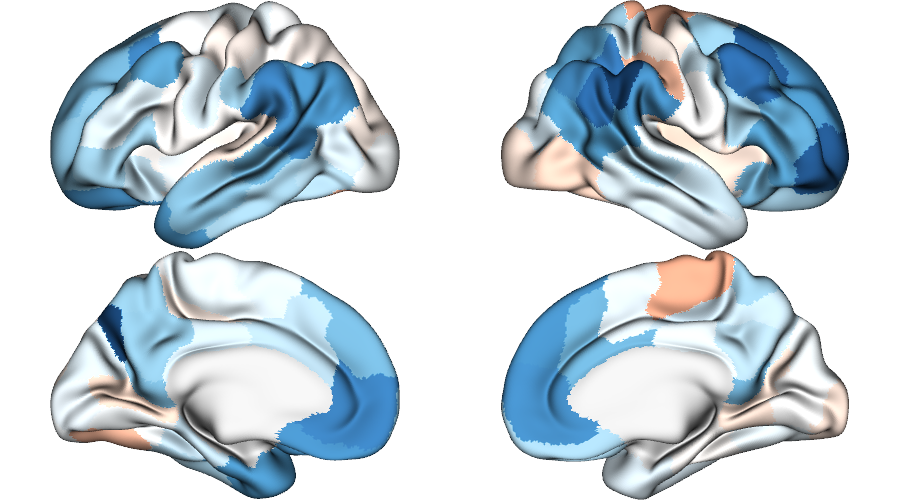

In [41]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_sc_conf, 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='grid',
)

Plot FDR-corrected (S8a):

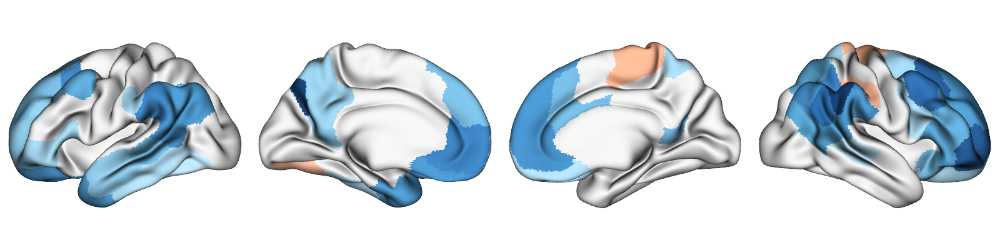

In [12]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_sc_conf[p_age_sc_conf_fdr<0.05], 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='row',
)

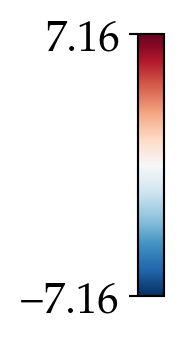

In [169]:
vmin = min(t_age_sc_conf.values.min(), -t_age_sc_conf.values.max())
vmax = -vmin
plot.plot_colorbar(vmin.round(2), vmax.round(2), 'RdBu_r', figsize=(2, 2));

Correlation with default age effect map:

In [14]:
r_aget_sc_conf, p_aget_sc_conf, _ = stats.spin_test_parcellated(t_age_sc_conf.to_frame(), t_age.to_frame(), 'schaefer-100', n_perm=1000)
print(
    'Correlation coefficients\n',
    r_aget_sc_conf,
    '\nSpin p-values\n',
    p_aget_sc_conf
)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Correlation coefficients
           0
t  0.958718 
Spin p-values
      0
t  0.0


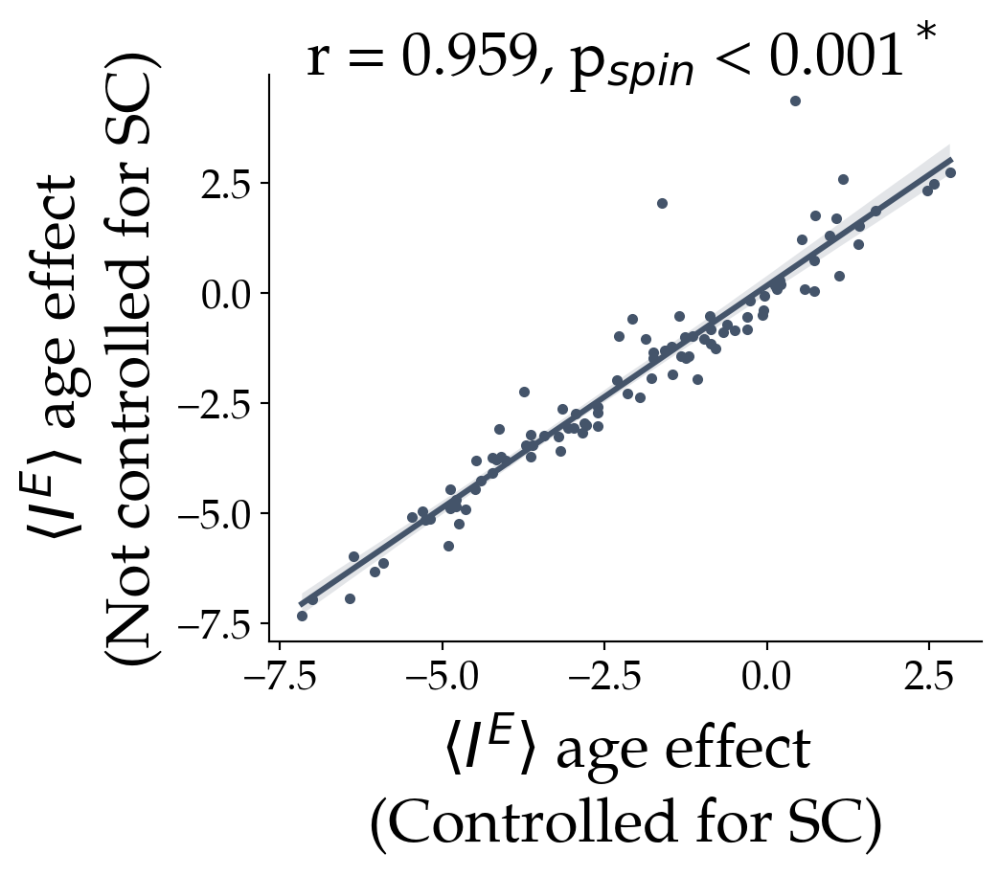

In [15]:
fig, ax = plt.subplots(figsize=(5,4))
sns.regplot(x=t_age_sc_conf, y=t_age, 
            scatter_kws=dict(color=thcolor, alpha=1, s=10), 
            line_kws=dict(color=thcolor), 
            ax=ax)
r = r_aget_sc_conf.values[0,0]
p = p_aget_sc_conf.values[0,0]
if p > 0.001:
    text = f'r = {r:.3f}, p = {p:.3f}'
else:
    text = f'r = {r:.3f}, p < 0.001'
if p < 0.05:
    text+=r'$^*$'
text = text.replace('p', r'p$_{spin}$')
text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
ax.text(text_x, text_y, 
        text,
        color='black',
        size=24,
        multialignment='left')
ax.set_xlabel(r'$\langle I^E \rangle$ age effect'
             '\n(Controlled for SC)', 
              fontdict=dict(fontsize=24))
ax.set_ylabel(r'$\langle I^E \rangle$ age effect'
             '\n(Not controlled for SC)',
             fontdict=dict(fontsize=24))
sns.despine()

## b. Using template SC

### Age effect

Load data:

In [16]:
itMax = 81
lmbda = 210
params = {
    'G': '0.5-4',
    'wee': '0.05-0.75',
    'wei': '0.05-0.75',
    'wie': '0',
}
het_params = 'wee-wei'
n_vols_remove = 10

parcels = transform.load_ordered_parcel_labels('schaefer-100')

In [52]:
if os.path.exists('pnc_fc-sub_sc-micamics_runs-1.csv') & os.path.exists('pnc_fc-sub_sc-micamics_runs-1_vars.pkz'):
    subjects_optima_temp = pd.read_csv('pnc_fc-sub_sc-micamics_runs-1.csv', index_col=0)
    with open('pnc_fc-sub_sc-micamics_runs-1_vars.pkz', 'rb') as f:
        regional_vars_temp = pickle.load(f)
else:
    subjects_optima_temp = []
    regional_vars_temp = {}
    for sub in tqdm(elig_subs.index):
        cmaes_dir = os.path.join(
            OUTPUT_DIR["pnc"], 'sim', 'group-micamics', 
            'ctx_parc-schaefer-100_mean001', sub,
            '6maps_schaefer-100_zscore',
            'cmaes_multimaps_gpu'
        )
        sims_dir = cmaes_dir.replace("cmaes_multimaps_gpu", "sims_multimaps_gpu")
        sc_path = os.path.join(
            OUTPUT_DIR["micamics"], 'SC', 'group-all',
            'ctx_parc-schaefer-100_approach-median_mean001_desc-strength.txt'
        )
        maps_path = os.path.join(INPUT_DIR, '6maps_schaefer-100_zscore.txt')
        emp_fc_tril_path = os.path.join(
            OUTPUT_DIR["pnc"], 'FC', sub,
            'ctx_parc-schaefer-100_hemi-LR_highpass-013_lowpass-none_exc-inter_desc-FCtril.txt'
        )
        emp_fcd_tril_path = emp_fc_tril_path.replace('FCtril', 'FCDtril')
        emp_fc_tril = np.loadtxt(emp_fc_tril_path)
        emp_fcd_tril = np.loadtxt(emp_fcd_tril_path)
        regional_vars_temp[sub] = {}
        for SeedMW in [1]:
            cmaes_res = load_cmaes(cmaes_dir, sims_dir, params, het_params, maps_path,
                                   emp_fc_tril, emp_fcd_tril,
                                   sc_path=sc_path,
                                   n_vols_remove=n_vols_remove,
                                   itMax=itMax, lmbda=lmbda, SeedMW=SeedMW, dataset='pnc')
            if cmaes_res:
                cmaes_res[0]['sub'] = sub
                cmaes_res[0]['SeedMW'] = SeedMW
                subjects_optima_temp.append(cmaes_res[0])
                regional_vars_temp[sub][SeedMW] = cmaes_res[1]
    subjects_optima_temp = pd.DataFrame(subjects_optima_temp)
    subjects_optima_temp.to_csv('pnc_fc-sub_sc-micamics_runs-1.csv')
    with open('pnc_fc-sub_sc-micamics_runs-1_vars.pkz', 'wb') as f:
        pickle.dump(regional_vars_temp, f)

best_runs = subjects_optima_temp.groupby('sub')['gof'].idxmax().values
data_temp = subjects_optima_temp.loc[best_runs].set_index('sub')
data_temp[['age', 'sex','group']] = elig_subs.loc[data_temp.index,['age', 'sex','group']]
data_temp['Age (y)'] = data_temp['age'] / 12
data_temp.head()

# add motion data
motion = pd.read_csv(
    os.path.join(OUTPUT_DIR["pnc"], 'postfmriprep', 'participants.tsv'), 
    delimiter="\t", index_col=0
).loc[data_temp.index]
data_temp = pd.concat([data_temp, motion], axis=1)

In [23]:
I_E_temp = pd.DataFrame(index=data_temp.index, columns=parcels, dtype=float)
for i, parc in enumerate(parcels):
    for sub, row in data_temp.iterrows():
        I_E_temp.loc[sub, parc] = regional_vars_temp[sub][row['SeedMW']].loc[i, 'I_E']

Effect of age:

In [26]:
df = pd.concat([I_E_temp, data_temp], axis=1)
df.columns = [f'node_{i}' for i in range(100)] + list(df.columns[100:])
df['age'] = df['Age (y)']

t_age_temp = pd.Series(index=parcels)
p_age_temp = pd.Series(index=parcels)
outliers = {}
for i, parc in enumerate(parcels):
    # exclude outliers
    curr_subs = df.index[(scipy.stats.zscore(df.loc[:, f'node_{i}']).abs() < 3)]
    outliers[parc] = set(df.index) - set(curr_subs)
    model_df = df.loc[curr_subs]
    # fit the model
    mod = smf.ols(f'node_{i} ~ age + gof + sex + mean_rms', data=df)
    res = mod.fit()
    t_age_temp.loc[parc] = res.tvalues['age']
    p_age_temp.loc[parc] = res.pvalues['age']

# FDR correction
_, p_age_temp_fdr = statsmodels.stats.multitest.fdrcorrection(p_age_temp)
p_age_temp_fdr = pd.Series(p_age_temp_fdr, index=parcels)

# display stats of signficant regions
stats_age_temp = pd.DataFrame({"t": t_age_temp, "p": p_age_temp, "p_fdr": p_age_temp_fdr})
stats_age_temp[stats_age_temp["p_fdr"] < 0.05].sort_values(by="t").round(3)

,t,p,p_fdr
7Networks_RH_Default_Par_1,-6.365,0.000,0.000
7Networks_LH_Default_PFC_7,-4.163,0.000,0.000
7Networks_RH_Cont_PFCl_2,-4.121,0.000,0.000
7Networks_RH_Default_PFCdPFCm_3,-4.111,0.000,0.000
7Networks_LH_Default_Temp_2,-3.632,0.000,0.002
7Networks_LH_Default_PFC_2,-3.412,0.001,0.004
7Networks_LH_Cont_PFCl_1,-3.306,0.001,0.005
7Networks_LH_Default_Par_1,-3.187,0.001,0.007
7Networks_LH_Default_PFC_4,-2.985,0.003,0.012
7Networks_LH_Default_PFC_6,-2.955,0.003,0.013


In [29]:
stats_age_temp.to_csv("p_pnc_fc-sub_sc-micamics_runs-1_IE_age_stats.csv")

Plot unthresholded (5c-right):

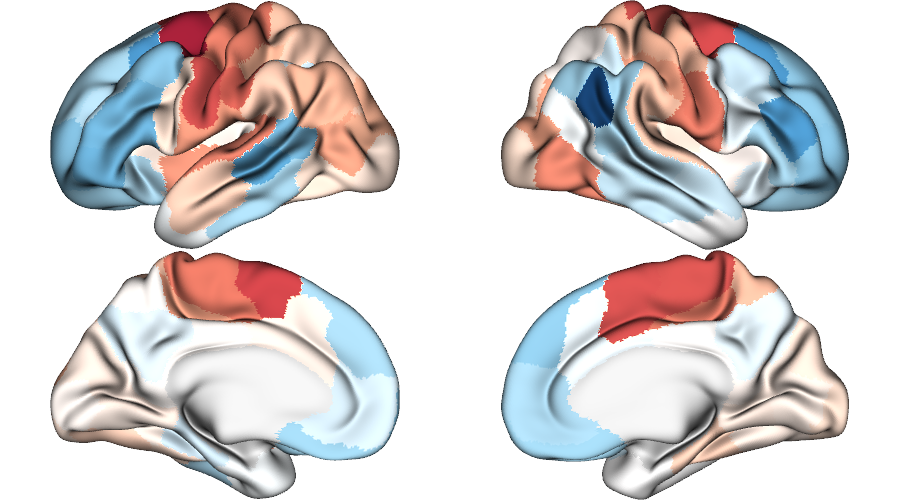

In [45]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_temp, 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='grid',
)

Plot FDR-corrected (S8b-top):

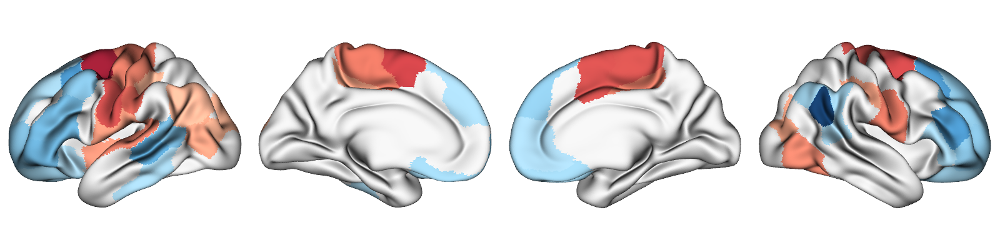

In [25]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_temp[p_age_temp_fdr<0.05], 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='row',
)

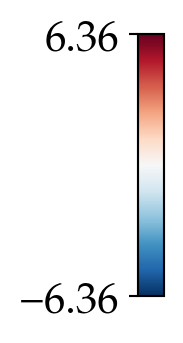

In [19]:
vmin = min(t_age_temp.values.min(), -t_age_temp.values.max())
vmax = -vmin
plot.plot_colorbar(vmin.round(2), vmax.round(2), 'RdBu_r', figsize=(2, 2));

Spatial correlation with subject-level age effects:

In [31]:
r_aget_temp, p_aget_temp, _ = stats.spin_test_parcellated(t_age_temp.to_frame(), t_age.to_frame(), 'schaefer-100', n_perm=1000)
print(
    'Correlation coefficients\n',
    r_aget_temp,
    '\nSpin p-values\n',
    p_aget_temp
)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Correlation coefficients
           0
t  0.617526 
Spin p-values
      0
t  0.0


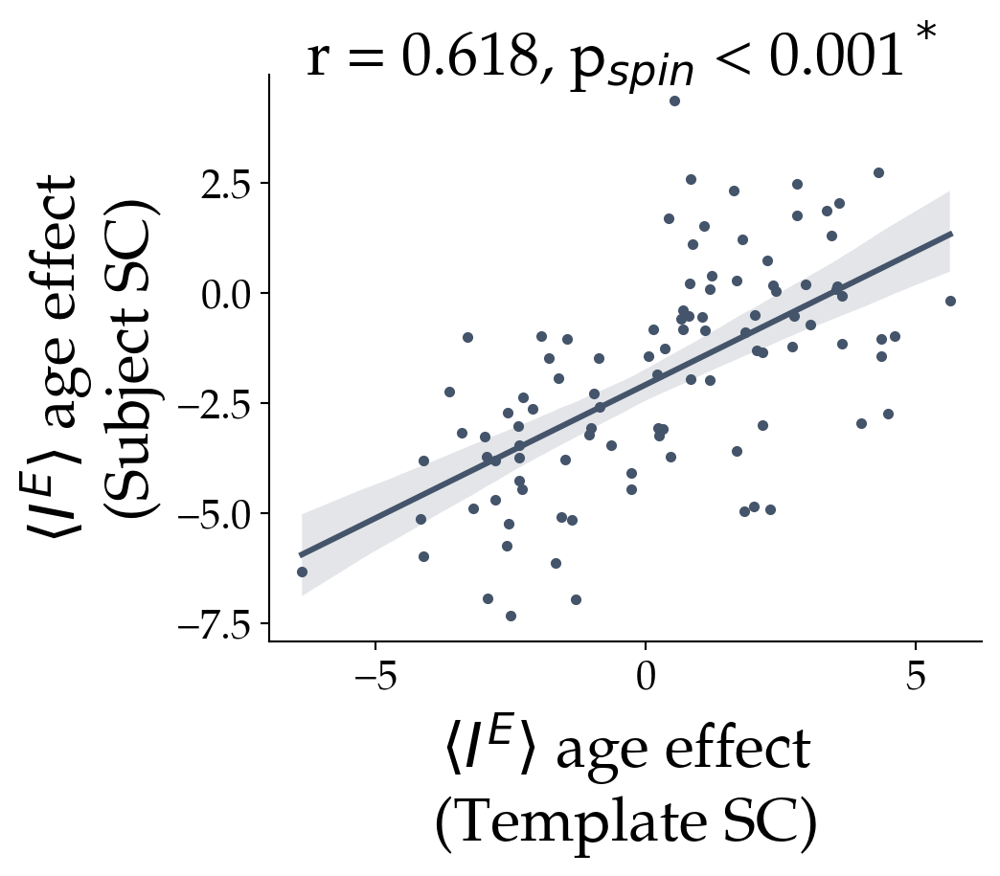

In [32]:
fig, ax = plt.subplots(figsize=(5,4))
sns.regplot(x=t_age_temp, y=t_age, 
            scatter_kws=dict(color=thcolor, alpha=1, s=10), 
            line_kws=dict(color=thcolor), 
            ax=ax)
r = r_aget_temp.values[0,0]
p = p_aget_temp.values[0,0]
if p > 0.001:
    text = f'r = {r:.3f}, p = {p:.3f}'
else:
    text = f'r = {r:.3f}, p < 0.001'
if p < 0.05:
    text+=r'$^*$'
text = text.replace('p', r'p$_{spin}$')
text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
ax.text(text_x, text_y, 
        text,
        color='black',
        size=24,
        multialignment='left')
ax.set_xlabel(r'$\langle I^E \rangle$ age effect'
             '\n(Template SC)', 
              fontdict=dict(fontsize=24))
ax.set_ylabel(r'$\langle I^E \rangle$ age effect'
             '\n(Subject SC)',
             fontdict=dict(fontsize=24))
sns.despine()

### Comparison of GOF

In [54]:
subjects_optima_main = subjects_optima.loc[subjects_optima['SeedMW']==1].reset_index(drop=True) # select seedmw 1 to match current seed
subjects_optima_temp['SC'] = 'Template'
subjects_optima_main['SC'] = 'Subject'
subjects_optima_combined = pd.concat([subjects_optima_temp, subjects_optima_main], axis=0)

Goodness of fit	-14.775	0.0
FC correlation	-25.177	0.0
SC-FC coupling	39.827	0.0
FC difference	-5.494	0.0
FCD KS distance	15.143	0.0


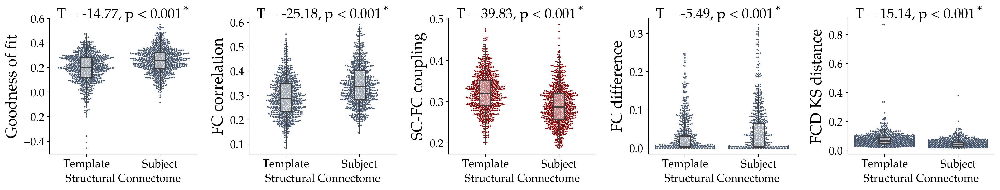

In [55]:
gof_labels = {    
    'gof': 'Goodness of fit',
    'fc_corr': 'FC correlation',
    'sc_fc': 'SC-FC coupling',
    'fc_diff': 'FC difference',
    'fcd_ks': 'FCD KS distance',
}
fig, axd = plt.subplot_mosaic(
    [
        ['gof','fc_corr', 'sc_fc', 'fc_diff', 'fcd_ks'],
    ],
    gridspec_kw=dict(width_ratios=[1]*5, height_ratios=[1]), 
    figsize=(20, 4)
)

for i, (col, label) in enumerate(gof_labels.items()):
    ax = axd[col]
    if col == 'sc_fc':
        color = 'darkred'
    else:
        color= '#44546A'
    sns.swarmplot(
        data=subjects_optima_combined,
        x='SC', y=col,
        s=2, color=color,
        ax=ax
    )
    sns.boxplot(
        data=subjects_optima_combined,
        x='SC', y=col,
        showfliers=False,
        showcaps=False, width=0.15,
        boxprops={"facecolor": (1, 1, 1, 0.5)},
        ax=ax)
    plt.setp(ax.collections, zorder=0, label="") # puts swarm in the back
    ax.set_ylabel(label, fontsize=22)
    ax.set_xlabel('Structural Connectome')
    sns.despine()
    # add statistics
    t, p = scipy.stats.ttest_rel(
        subjects_optima_temp.loc[:, col], 
        subjects_optima_main.loc[:, col])
    if add_text:
        if p > 0.001:
            text = f'T = {t:.2f}, p = {p:.3f}'
        else:
            text = f'T = {t:.2f}, p < 0.001'
        if p < 0.05:
            text+=r'$^*$'
        text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
        text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
        ax.text(text_x, text_y, 
                text,
                color='black',
                size=20,
                multialignment='left')
    print(label, round(t, 3), round(p,3), sep="\t")
fig.tight_layout(pad=1.0)

In [56]:
(
    subjects_optima_temp[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty', 'sc_fc']]
  - subjects_optima_main[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty', 'sc_fc']]
).describe().round(3)

,gof,fc_corr,fc_diff,fcd_ks,fic_penalty,sc_fc
count,752.000,752.000,752.000,752.000,752.000,752.000
mean,-0.062,-0.048,-0.015,0.029,-0.993,0.031
std,0.114,0.052,0.075,0.052,0.016,0.021
min,-0.545,-0.242,-0.314,-0.246,-1.069,-0.030
25%,-0.135,-0.080,-0.031,0.007,-1.004,0.016
50%,-0.082,-0.047,0.001,0.025,-0.993,0.028
75%,-0.010,-0.016,0.021,0.045,-0.982,0.046
max,0.319,0.125,0.168,0.827,-0.950,0.099


# Figure S9 and 5b. Effect of age on $\langle I_i^E \rangle$ in age groups

Load age-group-level data:

In [3]:
groups = pd.read_csv(
    os.path.join(INPUT_DIR, "pnc_age_groups.csv"), index_col=0
).sort_index()

if os.path.exists('pnc_fc-group_sc-micamics_runs-1.csv') & os.path.exists('pnc_fc-group_sc-micamics_runs-1_vars.pkz'):
    groups_optima = pd.read_csv('pnc_fc-group_sc-micamics_runs-1.csv', index_col=0)
    with open('pnc_fc-group_sc-micamics_runs-1_vars.pkz', 'rb') as f:
        regional_vars_group = pickle.load(f)
else:
    groups_optima = []
    regional_vars_group = {}
    for group in tqdm(groups.index):
        cmaes_dir = os.path.join(
            OUTPUT_DIR["pnc"], 'sim', 'group-micamics', 
            'ctx_parc-schaefer-100_mean001', group,
            '6maps_schaefer-100_zscore',
            'cmaes_multimaps_gpu'
        )
        sims_dir = cmaes_dir.replace("cmaes_multimaps_gpu", "sims_multimaps_gpu")
        sc_path = os.path.join(
            OUTPUT_DIR["micamics"], 'SC', 'group-all',
            'ctx_parc-schaefer-100_approach-median_mean001_desc-strength.txt'
        )
        maps_path = os.path.join(INPUT_DIR, '6maps_schaefer-100_zscore.txt')
        emp_fc_tril_path = os.path.join(
            OUTPUT_DIR["pnc"], 'FC', group,
            'ctx_parc-schaefer-100_hemi-LR_highpass-013_lowpass-none_exc-inter_desc-FCtril.txt'
        )
        emp_fcd_tril_path = emp_fc_tril_path.replace('FCtril', 'FCDtril')
        emp_fc_tril = np.loadtxt(emp_fc_tril_path)
        emp_fcd_tril = np.loadtxt(emp_fcd_tril_path)
        regional_vars_group[group] = {}
        for SeedMW in [1]:
            cmaes_res = load_cmaes(cmaes_dir, sims_dir, params, het_params, maps_path,
                                   emp_fc_tril, emp_fcd_tril,
                                   sc_path=sc_path,
                                   n_vols_remove=n_vols_remove,
                                   itMax=itMax, lmbda=lmbda, SeedMW=SeedMW, dataset='pnc')
            if cmaes_res:
                cmaes_res[0]['group'] = group
                cmaes_res[0]['SeedMW'] = SeedMW
                groups_optima.append(cmaes_res[0])
                regional_vars_group[group][SeedMW] = cmaes_res[1]
    groups_optima = pd.DataFrame(groups_optima)
    groups_optima.to_csv('pnc_fc-group_sc-micamics_runs-1.csv')
    with open('pnc_fc-group_sc-micamics_runs-1_vars.pkz', 'wb') as f:
        pickle.dump(regional_vars_group, f)

data_group = groups_optima.set_index('group')
data_group[['Age (y)', 'Fp']] = groups.loc[data_group.index,['age', 'F%']]

# add group-averaged motion data
motion = pd.read_csv(
    os.path.join(OUTPUT_DIR["pnc"], 'postfmriprep', 'participants.tsv'), 
    delimiter="\t", index_col=0
)
group_motion = pd.DataFrame(index=groups.index, columns=motion.columns, dtype=float)
for group in groups.index:
    group_subs = np.loadtxt(
        os.path.join(
            OUTPUT_DIR['pnc'], 'FC',
            group, 'subjects.txt'
        ), dtype=str
    )
    group_motion.loc[group, :] = motion.loc[group_subs].median(axis=0)
data_group = pd.concat([data_group, group_motion], axis=1)

In [162]:
I_E_group = pd.DataFrame(index=data_group.index, columns=parcels, dtype=float)
for i, parc in enumerate(parcels):
    for group, row in data_group.iterrows():
        I_E_group.loc[group, parc] = regional_vars_group[group][row['SeedMW']].loc[i, 'I_E']

In [163]:
groups.describe()

,age,F,M,N,F%
count,30.000000,30.000000,30.000000,30.000000,30.000000
mean,15.312761,13.633333,11.433333,25.066667,0.543556
std,2.478385,2.658536,2.568823,0.365148,0.103735
min,10.256667,7.000000,5.000000,25.000000,0.280000
25%,13.613333,12.000000,10.000000,25.000000,0.480000
50%,15.606667,13.500000,11.500000,25.000000,0.540000
75%,17.337500,15.000000,13.000000,25.000000,0.600000
max,18.922840,20.000000,18.000000,27.000000,0.800000


Effect of age:

In [164]:
df = pd.concat([I_E_group, data_group], axis=1)
df.columns = [f'node_{i}' for i in range(100)] + list(df.columns[100:])
df['age'] = df['Age (y)']

t_age_group = pd.Series(index=parcels)
p_age_group = pd.Series(index=parcels)
outliers = {}
for i, parc in enumerate(parcels):
    # fit the model
    mod = smf.ols(f'node_{i} ~ age + gof + Fp + mean_rms', data=df)
    res = mod.fit()
    t_age_group.loc[parc] = res.tvalues['age']
    p_age_group.loc[parc] = res.pvalues['age']

# FDR correction
_, p_age_group_fdr = statsmodels.stats.multitest.fdrcorrection(p_age_group)
p_age_group_fdr = pd.Series(p_age_group_fdr, index=parcels)

# display stats of signficant regions
stats_age_group = pd.DataFrame({"t": t_age_group, "p": p_age_group, "p_fdr": p_age_group_fdr})
stats_age_group[stats_age_group["p_fdr"] < 0.05].sort_values(by="t").round(3)

,t,p,p_fdr
7Networks_RH_Default_PFCdPFCm_3,-5.635,0.000,0.001
7Networks_LH_Cont_PFCl_1,-5.352,0.000,0.001
7Networks_LH_Default_PFC_7,-4.726,0.000,0.002
7Networks_LH_Default_PFC_5,-4.719,0.000,0.002
7Networks_RH_Default_PFCdPFCm_2,-4.699,0.000,0.002
7Networks_RH_Default_Par_1,-4.543,0.000,0.002
7Networks_RH_Cont_PFCl_2,-4.531,0.000,0.002
7Networks_RH_Default_PFCv_2,-4.170,0.000,0.003
7Networks_LH_Default_PFC_6,-3.676,0.001,0.009
7Networks_LH_Default_PFC_2,-3.229,0.003,0.018


In [75]:
stats_age_group.to_csv("p_pnc_fc-group_sc-micamics_runs-1_IE_age_stats.csv")

Plot unthresholded (5b):

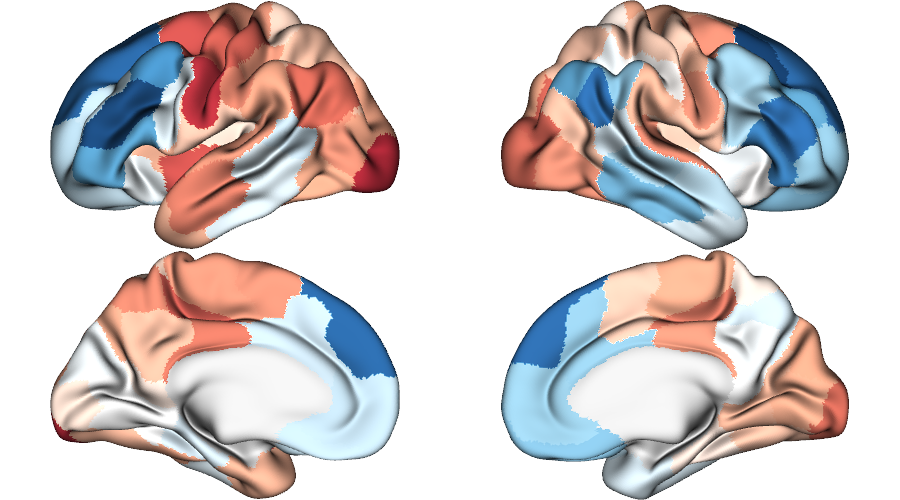

In [76]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_group, 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='grid',
)

Plot FDR-corrected (S9):

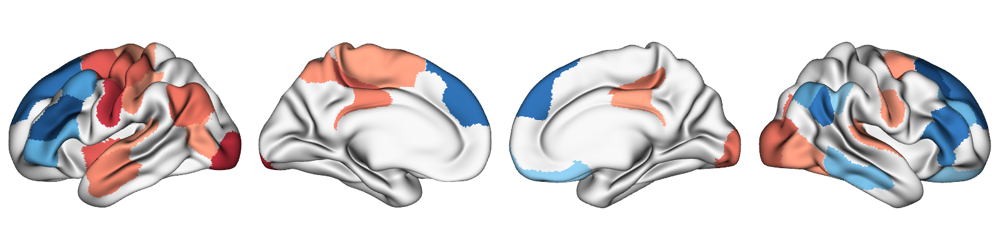

In [35]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_group[p_age_group_fdr<0.05], 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='row',
)

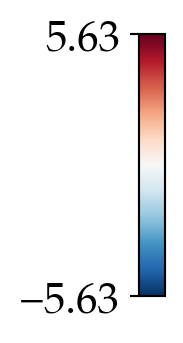

In [77]:
vmin = min(t_age_group.values.min(), -t_age_group.values.max())
vmax = -vmin
plot.plot_colorbar(vmin.round(2), vmax.round(2), 'RdBu_r', figsize=(2, 2));

Spatial correlation with subject-level age effects:

In [101]:
r_aget_group, p_aget_group, _ = stats.spin_test_parcellated(t_age_group.to_frame(), t_age_temp.to_frame(), 'schaefer-100', n_perm=1000)
print(
    'Correlation coefficients\n',
    r_aget_group,
    '\nSpin p-values\n',
    p_aget_group
)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Correlation coefficients
           0
0  0.835248 
Spin p-values
      0
0  0.0


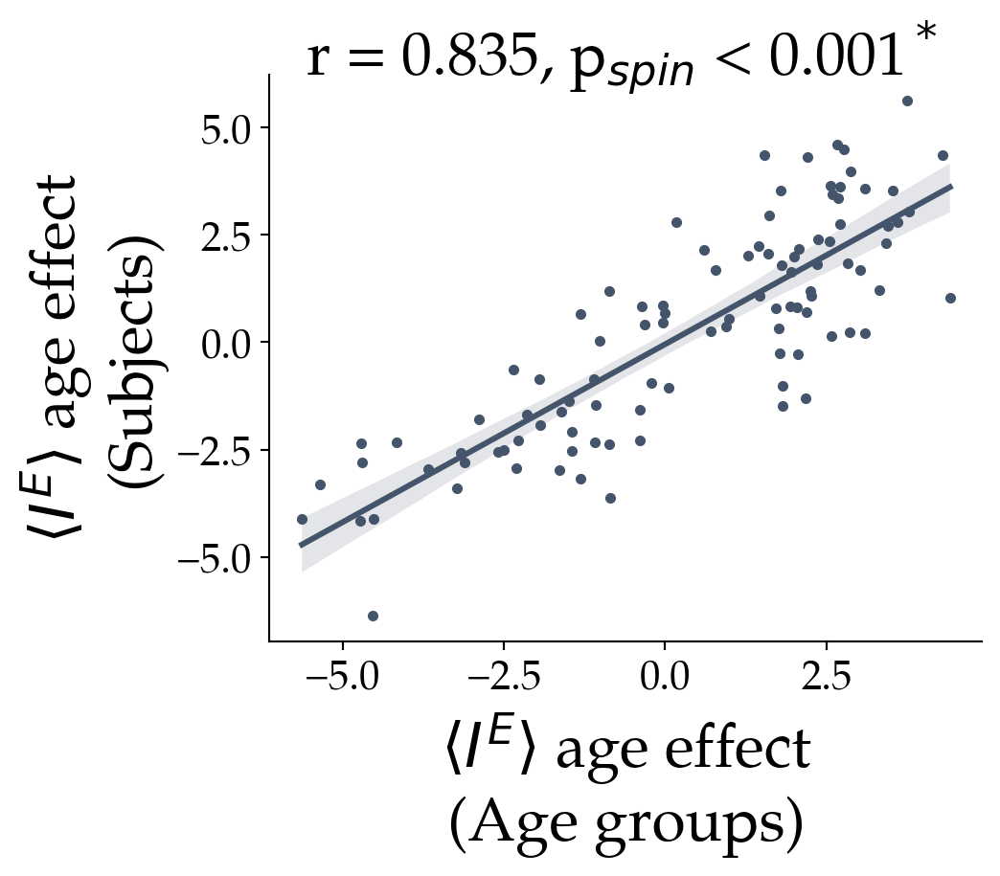

In [102]:
fig, ax = plt.subplots(figsize=(5,4))
sns.regplot(x=t_age_group, y=t_age_temp, 
            scatter_kws=dict(color=thcolor, alpha=1, s=10), 
            line_kws=dict(color=thcolor), 
            ax=ax)
r = r_aget_group.values[0,0]
p = p_aget_group.values[0,0]
if p > 0.001:
    text = f'r = {r:.3f}, p = {p:.3f}'
else:
    text = f'r = {r:.3f}, p < 0.001'
if p < 0.05:
    text+=r'$^*$'
text = text.replace('p', r'p$_{spin}$')
text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
ax.text(text_x, text_y, 
        text,
        color='black',
        size=24,
        multialignment='left')
ax.set_xlabel(r'$\langle I^E \rangle$ age effect'
             '\n(Age groups)', 
              fontdict=dict(fontsize=24))
ax.set_ylabel(r'$\langle I^E \rangle$ age effect'
             '\n(Subjects)',
             fontdict=dict(fontsize=24))
sns.despine()

# Figure S10 and 5d. Robustness of the findings to the effect of parcellation

Load data:

In [78]:
parcels_sch200 = transform.load_ordered_parcel_labels('schaefer-200')

In [96]:
if os.path.exists('pnc_fc-group_sc-micamics_sch200.csv') & os.path.exists('pnc_fc-group_sc-micamics_sch200_vars.pkz'):
    groups_optima_sch200 = pd.read_csv('pnc_fc-group_sc-micamics_sch200.csv', index_col=0)
    with open('pnc_fc-group_sc-micamics_sch200_vars.pkz', 'rb') as f:
        regional_vars_group_sch200 = pickle.load(f)
else:
    groups_optima_sch200 = []
    regional_vars_group_sch200 = {}
    for group in tqdm(groups.index):
        cmaes_dir = os.path.join(
            OUTPUT_DIR["pnc"], 'sim', 'group-micamics', 
            'ctx_parc-schaefer-200_mean001', group,
            '6maps_schaefer-200_zscore',
            'cmaes_multimaps_gpu'
        )
        sims_dir = cmaes_dir.replace("cmaes_multimaps_gpu", "sims_multimaps_gpu")
        sc_path = os.path.join(
            OUTPUT_DIR["micamics"], 'SC', 'group-all',
            'ctx_parc-schaefer-200_approach-median_mean001_desc-strength.txt'
        )
        maps_path = os.path.join(INPUT_DIR, '6maps_schaefer-200_zscore.txt')
        emp_fc_tril_path = os.path.join(
            OUTPUT_DIR["pnc"], 'FC', group,
            'ctx_parc-schaefer-200_hemi-LR_highpass-013_lowpass-none_exc-inter_desc-FCtril.txt'
        )
        emp_fcd_tril_path = emp_fc_tril_path.replace('FCtril', 'FCDtril')
        emp_fc_tril = np.loadtxt(emp_fc_tril_path)
        emp_fcd_tril = np.loadtxt(emp_fcd_tril_path)
        regional_vars_group_sch200[group] = {}
        for SeedMW in [1]:
            cmaes_res = load_cmaes(cmaes_dir, sims_dir, params, het_params, maps_path,
                                   emp_fc_tril, emp_fcd_tril,
                                   sc_path=sc_path,
                                   n_vols_remove=n_vols_remove,
                                   itMax=itMax, lmbda=lmbda, SeedMW=SeedMW, dataset='pnc',
                                   nodes=200,
                                   fc_prefix='ctx_parc-schaefer-200_hemi-LR_highpass-013_lowpass-none_exc-inter'
                                  )
            if cmaes_res:
                cmaes_res[0]['group'] = group
                cmaes_res[0]['SeedMW'] = SeedMW
                groups_optima_sch200.append(cmaes_res[0])
                regional_vars_group_sch200[group][SeedMW] = cmaes_res[1]
    groups_optima_sch200 = pd.DataFrame(groups_optima_sch200)
    groups_optima_sch200.to_csv('pnc_fc-group_sc-micamics_sch200.csv')
    with open('pnc_fc-group_sc-micamics_sch200_vars.pkz', 'wb') as f:
        pickle.dump(regional_vars_group_sch200, f)

data_group_sch200 = groups_optima_sch200.set_index('group')
data_group_sch200[['Age (y)', 'Fp']] = groups.loc[data_group_sch200.index,['age', 'F%']]
# add group-averaged motion data
data_group_sch200 = pd.concat([data_group_sch200, group_motion], axis=1)

## a. Comparison of GOF

In [98]:
data_group_main = data_group.copy()
data_group_sch200['Parcels'] = 200
data_group_main['Parcels'] = 100
data_group_combined = pd.concat([data_group_sch200, data_group_main], axis=0)

Goodness of fit	10.315	0.0
FC correlation	8.892	0.0
SC-FC coupling	-17.284	0.0
FC difference	0.112	0.911
FCD KS distance	-4.344	0.0


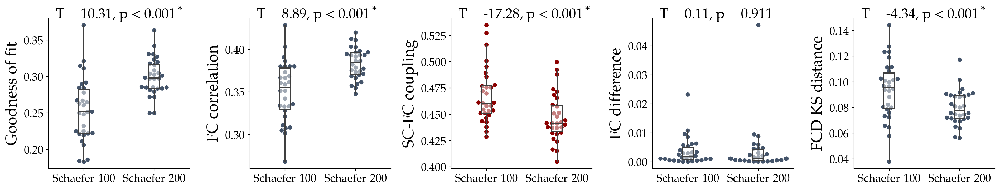

In [100]:
fig, axd = plt.subplot_mosaic(
    [
        ['gof','fc_corr', 'sc_fc', 'fc_diff', 'fcd_ks'],
    ],
    gridspec_kw=dict(width_ratios=[1]*5, height_ratios=[1]), 
    figsize=(20, 4)
)

for i, (col, label) in enumerate(gof_labels.items()):
    ax = axd[col]
    if col == 'sc_fc':
        color = 'darkred'
    else:
        color= '#44546A'
    sns.swarmplot(
        data=data_group_combined,
        x='Parcels', y=col,
        s=6, color=color,
        ax=ax
    )
    sns.boxplot(
        data=data_group_combined,
        x='Parcels', y=col,
        showfliers=False,
        showcaps=False, width=0.15,
        boxprops={"facecolor": (1, 1, 1, 0.5)},
        ax=ax)
    plt.setp(ax.collections, zorder=0, label="") # puts swarm in the back
    ax.set_ylabel(label, fontsize=22)
    ax.set_xticklabels(['Schaefer-100', 'Schaefer-200'])
    ax.set_xlabel('')
    sns.despine()
    # add statistics
    t, p = scipy.stats.ttest_rel(
        data_group_sch200.loc[:, col], 
        data_group_main.loc[:, col])
    if add_text:
        if p > 0.001:
            text = f'T = {t:.2f}, p = {p:.3f}'
        else:
            text = f'T = {t:.2f}, p < 0.001'
        if p < 0.05:
            text+=r'$^*$'
        text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
        text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
        ax.text(text_x, text_y, 
                text,
                color='black',
                size=20,
                multialignment='left')
    print(label, round(t, 3), round(p,3), sep="\t")
fig.tight_layout(pad=1.0)

In [101]:
data_group_sch200[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty', 'sc_fc']].describe()

,gof,fc_corr,fc_diff,fcd_ks,fic_penalty,sc_fc
count,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000
mean,0.299694,0.383389,0.003787,0.079909,0.032114,0.446943
std,0.025505,0.018367,0.008585,0.013238,0.003193,0.022595
min,0.249535,0.347772,0.000062,0.056196,0.023788,0.404813
25%,0.283823,0.370282,0.000513,0.071560,0.030248,0.433621
50%,0.297773,0.384406,0.001139,0.077843,0.032626,0.441473
75%,0.317092,0.396150,0.004125,0.089371,0.034605,0.458594
max,0.363270,0.420081,0.047177,0.117218,0.037160,0.499788


In [102]:
data_group_main[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty', 'sc_fc']].describe()

,gof,fc_corr,fc_diff,fcd_ks,fic_penalty,sc_fc
count,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000
mean,0.253462,0.350598,0.003591,0.093545,0.037152,0.467998
std,0.043960,0.035283,0.004734,0.022951,0.010910,0.026552
min,0.182876,0.267872,0.000005,0.037667,0.020826,0.428625
25%,0.221779,0.329445,0.000639,0.078942,0.026779,0.450946
50%,0.251450,0.355189,0.001879,0.095419,0.039307,0.460719
75%,0.282682,0.378359,0.005036,0.106901,0.045688,0.477560
max,0.370522,0.428798,0.023204,0.144228,0.057512,0.534820


In [103]:
(
    data_group_sch200[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty', 'sc_fc']]
  - data_group_main[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty', 'sc_fc']]
).describe().round(3)

,gof,fc_corr,fc_diff,fcd_ks,fic_penalty,sc_fc
count,30.000,30.000,30.000,30.000,30.000,30.000
mean,0.046,0.033,0.000,-0.014,-0.005,-0.021
std,0.025,0.020,0.010,0.017,0.010,0.007
min,-0.007,-0.009,-0.021,-0.054,-0.023,-0.035
25%,0.037,0.018,-0.003,-0.025,-0.013,-0.025
50%,0.050,0.031,-0.000,-0.016,-0.005,-0.021
75%,0.061,0.044,0.001,-0.001,0.003,-0.016
max,0.093,0.080,0.043,0.034,0.014,-0.010


## b. Age effect and its comparison to Schaefer-100

In [113]:
I_E_group_sch200 = pd.DataFrame(index=data_group_sch200.index, columns=parcels_sch200, dtype=float)
for i, parc in enumerate(parcels_sch200):
    for group, row in data_group_sch200.iterrows():
        I_E_group_sch200.loc[group, parc] = regional_vars_group_sch200[group][row['SeedMW']].loc[i, 'I_E']

In [117]:
df = pd.concat([I_E_group_sch200, data_group_sch200], axis=1)
df.columns = [f'node_{i}' for i in range(200)] + list(df.columns[200:])
df['age'] = df['Age (y)']

t_age_sch200 = pd.Series(index=parcels_sch200)
p_age_sch200 = pd.Series(index=parcels_sch200)
outliers = {}
for i, parc in enumerate(parcels_sch200):
    # fit the model
    mod = smf.ols(f'node_{i} ~ age + gof + Fp + mean_rms', data=df)
    res = mod.fit()
    t_age_sch200.loc[parc] = res.tvalues['age']
    p_age_sch200.loc[parc] = res.pvalues['age']

# FDR correction
_, p_age_sch200_fdr = statsmodels.stats.multitest.fdrcorrection(p_age_sch200)
p_age_sch200_fdr = pd.Series(p_age_group_fdr, index=parcels_sch200)


# display stats of signficant regions
stats_age_sch200 = pd.DataFrame({"t": t_age_sch200, "p": p_age_sch200, "p_fdr": p_age_sch200_fdr})
stats_age_sch200.to_csv("p_pnc_fc-group_sc-micamics_runs-1_IE_age_sch200_stats.csv")
stats_age_sch200[stats_age_sch200["p_fdr"] < 0.05].sort_values(by="t").round(3)

,t,p,p_fdr
7Networks_LH_Limbic_OFC_2,-5.607,0.000,0.002
7Networks_LH_Cont_PFCl_1,-4.973,0.000,0.004
7Networks_LH_Default_Temp_3,-3.990,0.001,0.019
7Networks_RH_Limbic_OFC_1,-3.943,0.001,0.019
7Networks_LH_Default_PFC_6,-3.912,0.001,0.019
7Networks_LH_Default_PFC_1,-3.869,0.001,0.019
7Networks_LH_Default_Temp_2,-3.868,0.001,0.019
7Networks_LH_Cont_PFCl_3,-3.843,0.001,0.019
7Networks_RH_Default_Temp_4,-3.783,0.001,0.019
7Networks_LH_Cont_PFCl_4,-3.753,0.001,0.019


Plot unthresholded (5d):

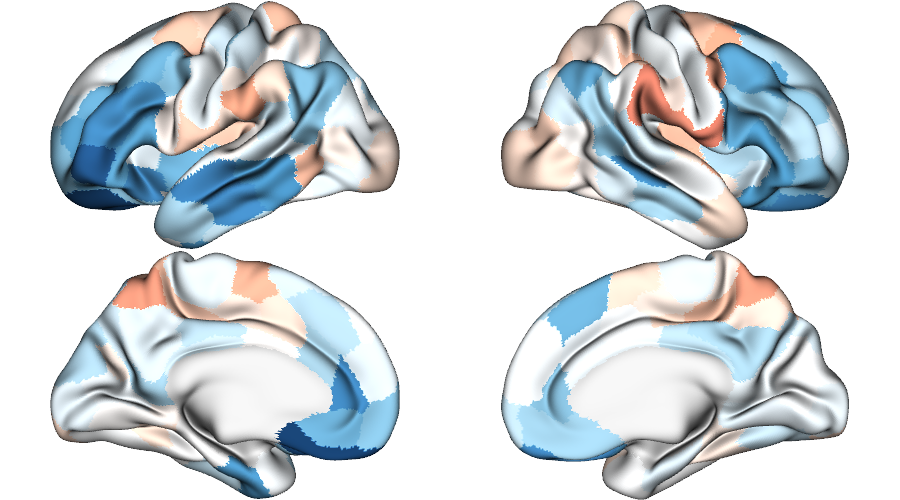

In [62]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_sch200, 'schaefer-200', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='grid',
)

Plot FDR-corrected (S10b):

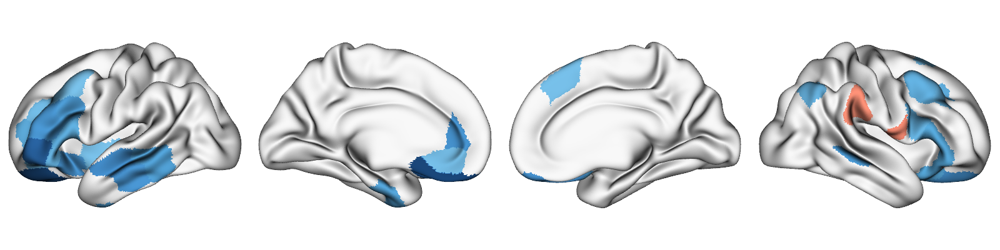

In [119]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_sch200[p_age_sch200_fdr<0.05], 'schaefer-200', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='row',
)

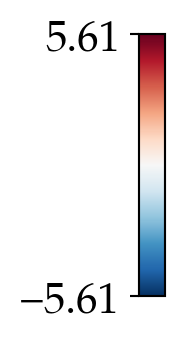

In [120]:
vmin = min(t_age_sch200.values.min(), -t_age_sch200.values.max())
vmax = -vmin
plot.plot_colorbar(vmin.round(2), vmax.round(2), 'RdBu_r', figsize=(2, 2));

Compare with main age effect after reparcellating it to Schaefer-200 parcellation:

In [128]:
# reparcellate into schaefer-200
t_age_group_main_sch200 = transform.parcellate_surf(transform.deparcellate_surf(t_age_group, 'schaefer-100'), 'schaefer-200', concat=True).iloc[:, 0]

r_aget_group, p_aget_group, _ = stats.spin_test_parcellated(t_age_sch200.to_frame(), t_age_group_main_sch200.to_frame(), 'schaefer-200', n_perm=1000)
print(
    'Correlation coefficients\n',
    r_aget_group,
    '\nSpin p-values\n',
    p_aget_group
)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Correlation coefficients
           0
0  0.478806 
Spin p-values
      0
0  0.0


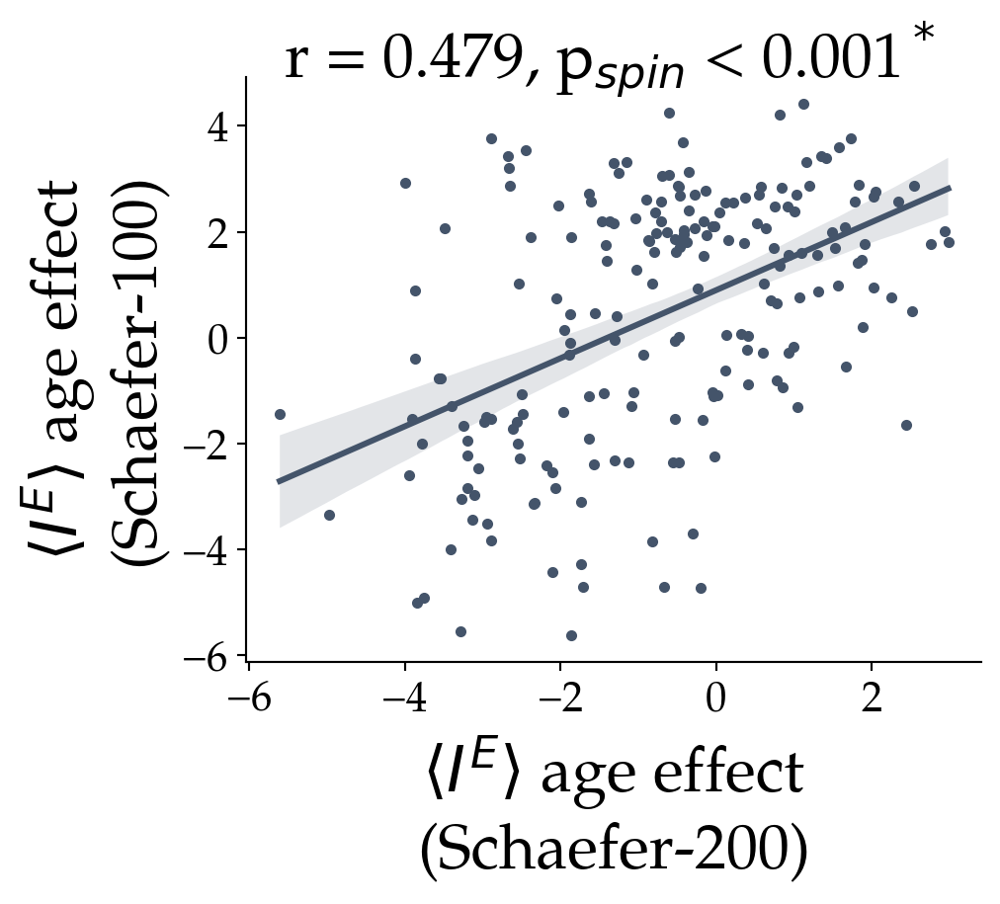

In [129]:
fig, ax = plt.subplots(figsize=(5,4))
sns.regplot(x=t_age_sch200, y=t_age_group_main_sch200, 
            scatter_kws=dict(color=thcolor, alpha=1, s=10), 
            line_kws=dict(color=thcolor), 
            ax=ax)
r = r_aget_group.values[0,0]
p = p_aget_group.values[0,0]
if p > 0.001:
    text = f'r = {r:.3f}, p = {p:.3f}'
else:
    text = f'r = {r:.3f}, p < 0.001'
if p < 0.05:
    text+=r'$^*$'
text = text.replace('p', r'p$_{spin}$')
text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
ax.text(text_x, text_y, 
        text,
        color='black',
        size=24,
        multialignment='left')
ax.set_xlabel(r'$\langle I^E \rangle$ age effect'
             '\n(Schaefer-200)', 
              fontdict=dict(fontsize=24))
ax.set_ylabel(r'$\langle I^E \rangle$ age effect'
             '\n(Schaefer-100)',
             fontdict=dict(fontsize=24))
sns.despine()

# Figure S11 and 5e. Robustness of the findings to the effect of heterogeneity maps

Note: Panel a uses data loaded in panels b and c, therefore is put after them.

## b. Age effect of I_E using two maps and its comparison to default 6 maps

Load data:

In [135]:
if os.path.exists('pnc_fc-group_sc-micamics_2maps.csv') & os.path.exists('pnc_fc-group_sc-micamics_2maps_vars.pkz'):
    groups_optima_2maps = pd.read_csv('pnc_fc-group_sc-micamics_2maps.csv', index_col=0)
    with open('pnc_fc-group_sc-micamics_2maps_vars.pkz', 'rb') as f:
        regional_vars_group_2maps = pickle.load(f)
else:
    groups_optima_2maps = []
    regional_vars_group_2maps = {}
    for group in tqdm(groups.index):
        cmaes_dir = os.path.join(
            OUTPUT_DIR["pnc"], 'sim', 'group-micamics', 
            'ctx_parc-schaefer-100_mean001', group,
            '2maps_schaefer-100_zscore',
            'cmaes_multimaps_gpu'
        )
        sims_dir = cmaes_dir.replace("cmaes_multimaps_gpu", "sims_multimaps_gpu")
        sc_path = os.path.join(
            OUTPUT_DIR["micamics"], 'SC', 'group-all',
            'ctx_parc-schaefer-100_approach-median_mean001_desc-strength.txt'
        )
        maps_path = os.path.join(INPUT_DIR, '2maps_schaefer-100_zscore.txt')
        emp_fc_tril_path = os.path.join(
            OUTPUT_DIR["pnc"], 'FC', group,
            'ctx_parc-schaefer-100_hemi-LR_highpass-013_lowpass-none_exc-inter_desc-FCtril.txt'
        )
        emp_fcd_tril_path = emp_fc_tril_path.replace('FCtril', 'FCDtril')
        emp_fc_tril = np.loadtxt(emp_fc_tril_path)
        emp_fcd_tril = np.loadtxt(emp_fcd_tril_path)
        regional_vars_group_2maps[group] = {}
        for SeedMW in [1]:
            cmaes_res = load_cmaes(cmaes_dir, sims_dir, params, het_params, maps_path,
                                   emp_fc_tril, emp_fcd_tril,
                                   sc_path=sc_path,
                                   n_vols_remove=n_vols_remove,
                                   itMax=itMax, lmbda=lmbda, SeedMW=SeedMW, dataset='pnc',
                                  )
            if cmaes_res:
                cmaes_res[0]['group'] = group
                cmaes_res[0]['SeedMW'] = SeedMW
                groups_optima_2maps.append(cmaes_res[0])
                regional_vars_group_2maps[group][SeedMW] = cmaes_res[1]
    groups_optima_2maps = pd.DataFrame(groups_optima_2maps)
    groups_optima_2maps.to_csv('pnc_fc-group_sc-micamics_2maps.csv')
    with open('pnc_fc-group_sc-micamics_2maps_vars.pkz', 'wb') as f:
        pickle.dump(regional_vars_group_2maps, f)

data_group_2maps = groups_optima_2maps.set_index('group')
data_group_2maps[['Age (y)', 'Fp']] = groups.loc[data_group_2maps.index,['age', 'F%']]
# add group-averaged motion data
data_group_2maps = pd.concat([data_group_2maps, group_motion], axis=1)

In [136]:
I_E_group_2maps = pd.DataFrame(index=data_group_2maps.index, columns=parcels, dtype=float)
for i, parc in enumerate(parcels):
    for group, row in data_group_2maps.iterrows():
        I_E_group_2maps.loc[group, parc] = regional_vars_group_2maps[group][row['SeedMW']].loc[i, 'I_E']

In [138]:
df = pd.concat([I_E_group_2maps, data_group_2maps], axis=1)
df.columns = [f'node_{i}' for i in range(100)] + list(df.columns[100:])
df['age'] = df['Age (y)']

t_age_group_2maps = pd.Series(index=parcels)
p_age_group_2maps = pd.Series(index=parcels)
outliers = {}
for i, parc in enumerate(parcels):
    # fit the model
    mod = smf.ols(f'node_{i} ~ age + gof + Fp + mean_rms', data=df)
    res = mod.fit()
    t_age_group_2maps.loc[parc] = res.tvalues['age']
    p_age_group_2maps.loc[parc] = res.pvalues['age']

# FDR correction
_, p_age_group_2maps_fdr = statsmodels.stats.multitest.fdrcorrection(p_age_group_2maps)
p_age_group_2maps_fdr = pd.Series(p_age_group_2maps_fdr, index=parcels)

# display age effect of signficant regions
t_age_group_2maps[p_age_group_2maps_fdr<0.05].sort_values()

# display stats of signficant regions
stats_age_group_2maps = pd.DataFrame({"t": t_age_group_2maps, "p": p_age_group_2maps, "p_fdr": p_age_group_2maps_fdr})
stats_age_group_2maps.to_csv("p_pnc_fc-group_sc-micamics_runs-1_IE_age_2maps_stats.csv")
stats_age_group_2maps[stats_age_group_2maps["p_fdr"] < 0.05].sort_values(by="t").round(3)

,t,p,p_fdr
7Networks_RH_Cont_PFCl_4,-4.673,0.000,0.009
7Networks_RH_Cont_pCun_1,-4.143,0.000,0.017
7Networks_RH_Cont_Par_1,-3.566,0.001,0.050


Plot unthresholded (5e-left):

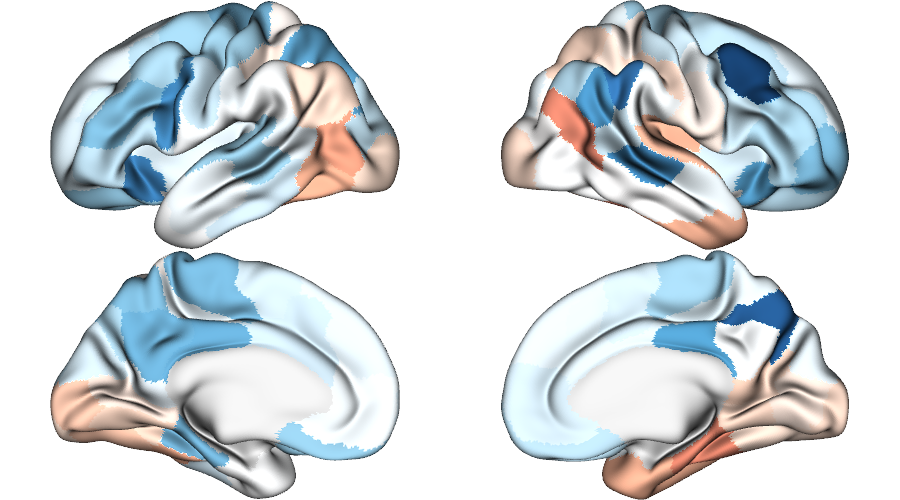

In [139]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_group_2maps, 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='grid',
)

Plot FDR-corrected (S11b):

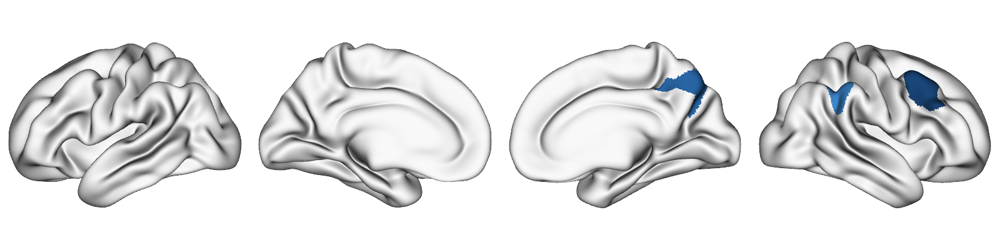

In [140]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_group_2maps[p_age_group_2maps_fdr<0.05], 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='row',
)

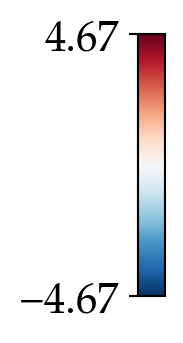

In [141]:
vmin = min(t_age_group_2maps.values.min(), -t_age_group_2maps.values.max())
vmax = -vmin
plot.plot_colorbar(vmin.round(2), vmax.round(2), 'RdBu_r', figsize=(2, 2));

Spatial correlation with the age effects based on default configurations:

In [143]:
r_aget_group, p_aget_group, _ = stats.spin_test_parcellated(t_age_group_2maps.to_frame(), t_age_group.to_frame(), 'schaefer-100', n_perm=1000)
print(
    'Correlation coefficients\n',
    r_aget_group,
    '\nSpin p-values\n',
    p_aget_group
)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Correlation coefficients
           0
0  0.338514 
Spin p-values
        0
0  0.005


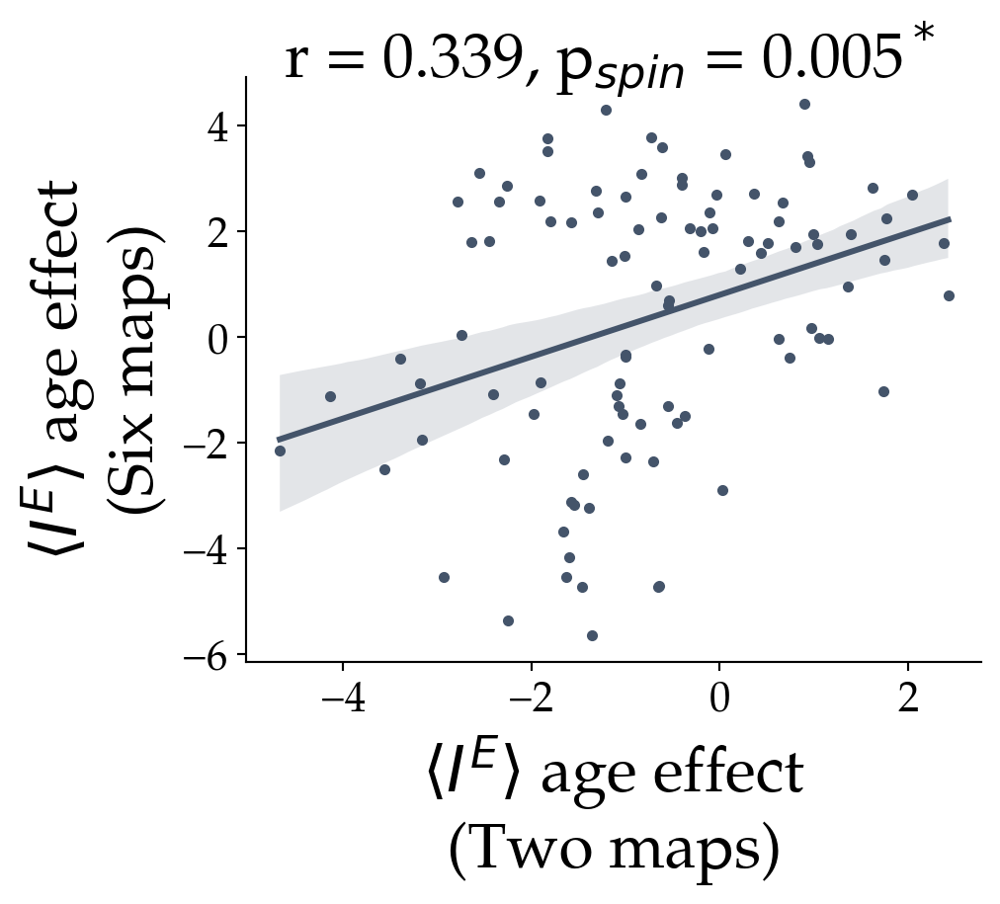

In [144]:
fig, ax = plt.subplots(figsize=(5,4))
sns.regplot(x=t_age_group_2maps, y=t_age_group, 
            scatter_kws=dict(color=thcolor, alpha=1, s=10), 
            line_kws=dict(color=thcolor), 
            ax=ax)
r = r_aget_group.values[0,0]
p = p_aget_group.values[0,0]
if p > 0.001:
    text = f'r = {r:.3f}, p = {p:.3f}'
else:
    text = f'r = {r:.3f}, p < 0.001'
if p < 0.05:
    text+=r'$^*$'
text = text.replace('p', r'p$_{spin}$')
text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
ax.text(text_x, text_y, 
        text,
        color='black',
        size=24,
        multialignment='left')
ax.set_xlabel(r'$\langle I^E \rangle$ age effect'
             '\n(Two maps)', 
              fontdict=dict(fontsize=24))
ax.set_ylabel(r'$\langle I^E \rangle$ age effect'
             '\n(Six maps)',
             fontdict=dict(fontsize=24))
sns.despine()

## c. Age effect of I_E using four maps and its comparison to default 6 maps

Load data:

In [149]:
if os.path.exists('pnc_fc-group_sc-micamics_4maps.csv') & os.path.exists('pnc_fc-group_sc-micamics_4maps_vars.pkz'):
    groups_optima_4maps = pd.read_csv('pnc_fc-group_sc-micamics_4maps.csv', index_col=0)
    with open('pnc_fc-group_sc-micamics_4maps_vars.pkz', 'rb') as f:
        regional_vars_group_4maps = pickle.load(f)
else:
    groups_optima_4maps = []
    regional_vars_group_4maps = {}
    for group in tqdm(groups.index):
        cmaes_dir = os.path.join(
            OUTPUT_DIR["pnc"], 'sim', 'group-micamics', 
            'ctx_parc-schaefer-100_mean001', group,
            '4maps_schaefer-100_zscore',
            'cmaes_multimaps_gpu'
        )
        sims_dir = cmaes_dir.replace("cmaes_multimaps_gpu", "sims_multimaps_gpu")
        sc_path = os.path.join(
            OUTPUT_DIR["micamics"], 'SC', 'group-all',
            'ctx_parc-schaefer-100_approach-median_mean001_desc-strength.txt'
        )
        maps_path = os.path.join(INPUT_DIR, '4maps_schaefer-100_zscore.txt')
        emp_fc_tril_path = os.path.join(
            OUTPUT_DIR["pnc"], 'FC', group,
            'ctx_parc-schaefer-100_hemi-LR_highpass-013_lowpass-none_exc-inter_desc-FCtril.txt'
        )
        emp_fcd_tril_path = emp_fc_tril_path.replace('FCtril', 'FCDtril')
        emp_fc_tril = np.loadtxt(emp_fc_tril_path)
        emp_fcd_tril = np.loadtxt(emp_fcd_tril_path)
        regional_vars_group_4maps[group] = {}
        for SeedMW in [1]:
            cmaes_res = load_cmaes(cmaes_dir, sims_dir, params, het_params, maps_path,
                                   emp_fc_tril, emp_fcd_tril,
                                   sc_path=sc_path,
                                   n_vols_remove=n_vols_remove,
                                   itMax=itMax, lmbda=lmbda, SeedMW=SeedMW, dataset='pnc',
                                  )
            if cmaes_res:
                cmaes_res[0]['group'] = group
                cmaes_res[0]['SeedMW'] = SeedMW
                groups_optima_4maps.append(cmaes_res[0])
                regional_vars_group_4maps[group][SeedMW] = cmaes_res[1]
    groups_optima_4maps = pd.DataFrame(groups_optima_4maps)
    groups_optima_4maps.to_csv('pnc_fc-group_sc-micamics_4maps.csv')
    with open('pnc_fc-group_sc-micamics_4maps_vars.pkz', 'wb') as f:
        pickle.dump(regional_vars_group_4maps, f)

data_group_4maps = groups_optima.set_index('group')
data_group_4maps[['Age (y)', 'Fp']] = groups.loc[data_group_4maps.index,['age', 'F%']]
# add group-averaged motion data
data_group_4maps = pd.concat([data_group_4maps, group_motion], axis=1)

In [150]:
I_E_group_4maps = pd.DataFrame(index=data_group_4maps.index, columns=parcels, dtype=float)
for i, parc in enumerate(parcels):
    for group, row in data_group_4maps.iterrows():
        I_E_group_4maps.loc[group, parc] = regional_vars_group_4maps[group][row['SeedMW']].loc[i, 'I_E']

Age effects:

In [171]:
df = pd.concat([I_E_group_4maps, data_group_4maps], axis=1)
df.columns = [f'node_{i}' for i in range(100)] + list(df.columns[100:])
df['age'] = df['Age (y)']

t_age_group_4maps = pd.Series(index=parcels)
p_age_group_4maps = pd.Series(index=parcels)
outliers = {}
for i, parc in enumerate(parcels):
    # fit the model
    mod = smf.ols(f'node_{i} ~ age + gof + Fp + mean_rms', data=df)
    res = mod.fit()
    t_age_group_4maps.loc[parc] = res.tvalues['age']
    p_age_group_4maps.loc[parc] = res.pvalues['age']

# FDR correction
_, p_age_group_4maps_fdr = statsmodels.stats.multitest.fdrcorrection(p_age_group_4maps)
p_age_group_4maps_fdr = pd.Series(p_age_group_4maps_fdr, index=parcels)

# display stats of signficant regions
stats_age_group_4maps = pd.DataFrame({"t": t_age_group_4maps, "p": p_age_group_4maps, "p_fdr": p_age_group_4maps_fdr})
stats_age_group_4maps.to_csv("p_pnc_fc-group_sc-micamics_runs-1_IE_age_4maps_stats.csv")
stats_age_group_4maps[stats_age_group_4maps["p_fdr"] < 0.05].sort_values(by="t").round(3)

,t,p,p_fdr
7Networks_LH_Vis_1,-4.663,0.000,0.009
7Networks_LH_DorsAttn_PrCv_1,-3.681,0.001,0.030
7Networks_RH_Cont_pCun_1,-3.488,0.002,0.030
7Networks_RH_Default_Par_1,-3.404,0.002,0.032
7Networks_LH_Cont_PFCl_1,-3.302,0.003,0.032
7Networks_LH_Default_PFC_7,-3.078,0.005,0.036
7Networks_LH_Default_PFC_2,-2.976,0.006,0.036
7Networks_RH_Default_PFCdPFCm_3,-2.825,0.009,0.043
7Networks_LH_Default_PFC_5,-2.769,0.010,0.045
7Networks_LH_SalVentAttn_Med_1,-2.729,0.011,0.046


Plot unthresholded (5e-right):

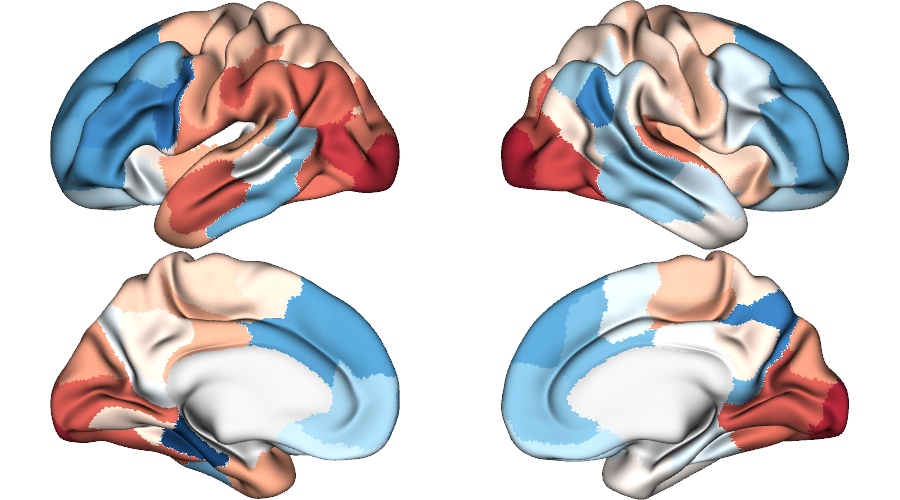

In [155]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_group_4maps, 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='grid',
)

Plot FDR-corrected (S11c):

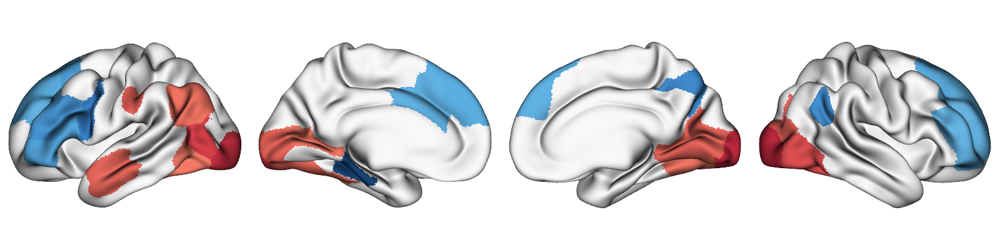

In [154]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_group_4maps[p_age_group_4maps_fdr<0.05], 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='row',
)

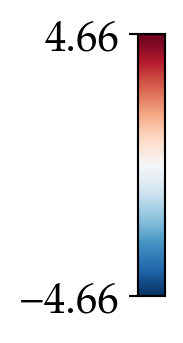

In [165]:
vmin = min(t_age_group_4maps.values.min(), -t_age_group_4maps.values.max())
vmax = -vmin
plot.plot_colorbar(vmin.round(2), vmax.round(2), 'RdBu_r', figsize=(2, 2));

Spatial correlation with age effects map resulted from default configurations:

In [157]:
r_aget_group, p_aget_group, _ = stats.spin_test_parcellated(t_age_group_4maps.to_frame(), t_age_group.to_frame(), 'schaefer-100', n_perm=1000)
print(
    'Correlation coefficients\n',
    r_aget_group,
    '\nSpin p-values\n',
    p_aget_group
)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Correlation coefficients
           0
0  0.836924 
Spin p-values
      0
0  0.0


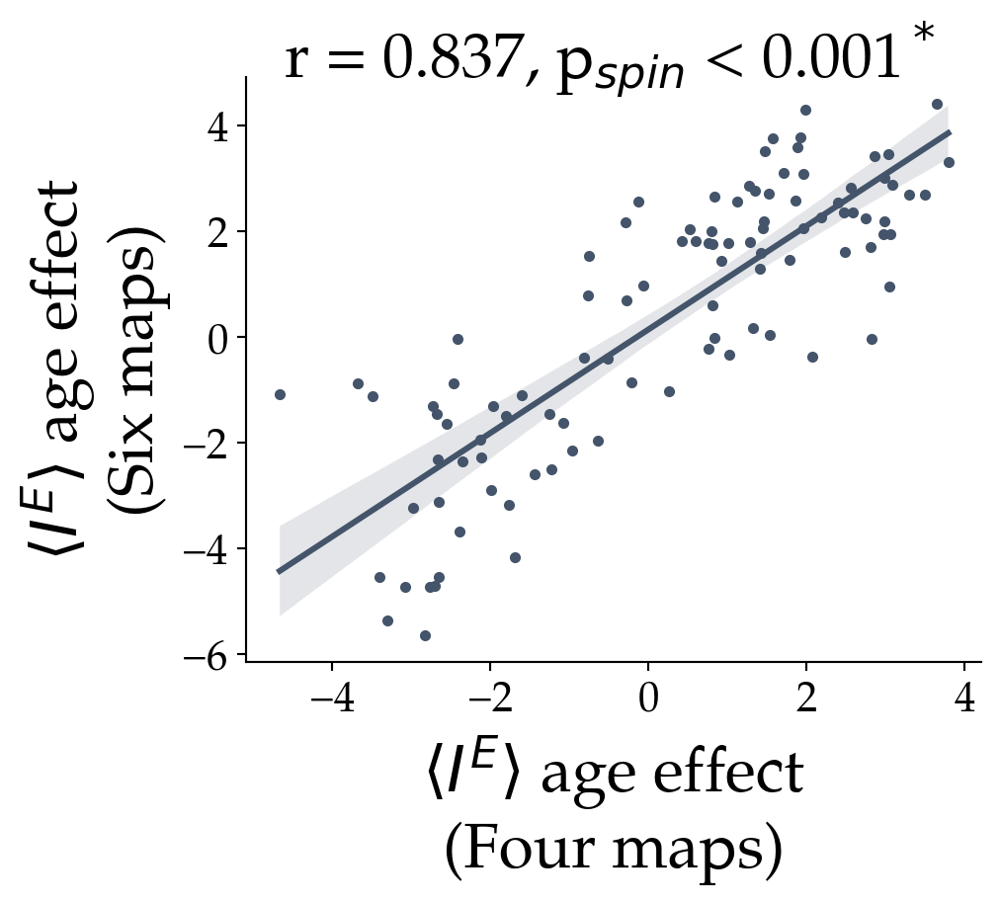

In [166]:
fig, ax = plt.subplots(figsize=(5,4))
sns.regplot(x=t_age_group_4maps, y=t_age_group, 
            scatter_kws=dict(color=thcolor, alpha=1, s=10), 
            line_kws=dict(color=thcolor), 
            ax=ax)
r = r_aget_group.values[0,0]
p = p_aget_group.values[0,0]
if p > 0.001:
    text = f'r = {r:.3f}, p = {p:.3f}'
else:
    text = f'r = {r:.3f}, p < 0.001'
if p < 0.05:
    text+=r'$^*$'
text = text.replace('p', r'p$_{spin}$')
text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
ax.text(text_x, text_y, 
        text,
        color='black',
        size=24,
        multialignment='left')
ax.set_xlabel(r'$\langle I^E \rangle$ age effect'
             '\n(Four maps)', 
              fontdict=dict(fontsize=24))
ax.set_ylabel(r'$\langle I^E \rangle$ age effect'
             '\n(Six maps)',
             fontdict=dict(fontsize=24))
sns.despine()

## a. Comparison of GOF

In [172]:
groups_optima_6maps = groups_optima_main
groups_optima_2maps['Number of maps'] = 2
groups_optima_4maps['Number of maps'] = 4
groups_optima_6maps['Number of maps'] = 6
groups_optima_combined = pd.concat([groups_optima_2maps, groups_optima_4maps, groups_optima_6maps], axis=0)

6 vs	2	Goodness of fit	-4.068	0.0
6 vs	4	Goodness of fit	-0.886	0.383
6 vs	2	FC correlation	-1.235	0.227
6 vs	4	FC correlation	-2.159	0.039
6 vs	2	FC difference	-0.015	0.988
6 vs	4	FC difference	0.853	0.401
6 vs	2	FCD KS distance	3.964	0.0
6 vs	4	FCD KS distance	-1.335	0.192


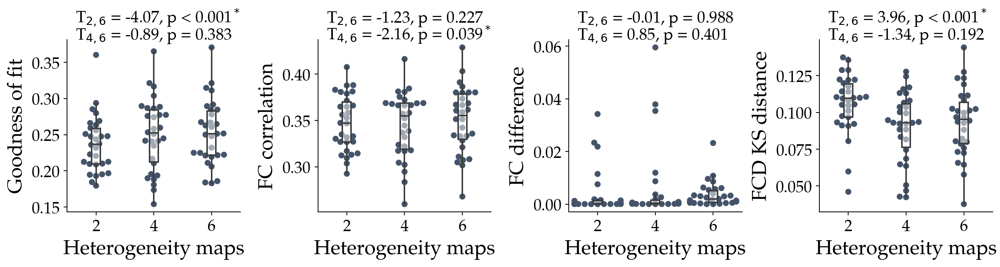

In [173]:
gof_labels = {    
    'gof': 'Goodness of fit',
    'fc_corr': 'FC correlation',
    'fc_diff': 'FC difference',
    'fcd_ks': 'FCD KS distance',
}
fig, axes = plt.subplots(1, 4, figsize=(14, 4))

for i, (col, label) in enumerate(gof_labels.items()):
    ax = axes[i]
    color= '#44546A'
    sns.swarmplot(
        data=groups_optima_combined,
        x='Number of maps', y=col,
        s=6, color=color,
        ax=ax
    )
    sns.boxplot(
        data=groups_optima_combined,
        x='Number of maps', y=col,
        showfliers=False,
        showcaps=False, width=0.15,
        boxprops={"facecolor": (1, 1, 1, 0.5)},
        ax=ax)
    plt.setp(ax.collections, zorder=0, label="") # puts swarm in the back
    ax.set_ylabel(label, fontsize=20)
    ax.set_xlabel('Heterogeneity maps', fontsize=20)
    sns.despine()
    # add statistics
    for comp_nmaps in [2, 4]:
        t, p = scipy.stats.ttest_rel(
            groups_optima_combined.loc[groups_optima_combined['Number of maps']==comp_nmaps, col],
            groups_optima_combined.loc[groups_optima_combined['Number of maps']==6, col],
        )
        if add_text:
            text = r'T$_{' + str(comp_nmaps) + r',6}$'
            if p > 0.001:
                text += f' = {t:.2f}, p = {p:.3f}'
            else:
                text += f' = {t:.2f}, p < 0.001'
            if p < 0.05:
                text+=r'$^*$'
            text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
            if comp_nmaps == 2:
                text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1.1
            else:
                text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
            ax.text(text_x, text_y, 
                    text,
                    color='black',
                    size=16,
                    multialignment='left')
        print("6 vs", comp_nmaps, label, round(t, 3), round(p,3), sep="\t")
fig.tight_layout(pad=1.0)

In [174]:
groups_optima_2maps[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty']].describe()

,gof,fc_corr,fc_diff,fcd_ks,fic_penalty
count,30.000000,30.000000,30.000000,30.000000,30.000000
mean,0.237173,0.346958,0.003564,0.106222,0.040498
std,0.038802,0.030031,0.008324,0.020013,0.012556
min,0.179508,0.292505,0.000004,0.046045,0.018410
25%,0.209666,0.326713,0.000048,0.096951,0.031593
50%,0.236706,0.347090,0.000153,0.109734,0.037587
75%,0.258425,0.370084,0.001378,0.119397,0.048167
max,0.360162,0.407624,0.034218,0.137442,0.073174


In [175]:
(
    groups_optima_2maps[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty', 'sc_fc']]
  - groups_optima_6maps[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty', 'sc_fc']]
).describe().round(3)

,gof,fc_corr,fc_diff,fcd_ks,fic_penalty,sc_fc
count,30.000,30.000,30.000,30.000,30.000,30.0
mean,-0.016,-0.004,-0.000,0.013,0.003,0.0
std,0.022,0.016,0.010,0.018,0.016,0.0
min,-0.081,-0.038,-0.023,-0.030,-0.019,0.0
25%,-0.021,-0.015,-0.003,0.006,-0.007,0.0
50%,-0.011,-0.000,-0.001,0.009,0.001,0.0
75%,-0.003,0.007,0.000,0.015,0.008,0.0
max,0.027,0.026,0.033,0.070,0.049,0.0


In [176]:
groups_optima_4maps[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty']].describe()

,gof,fc_corr,fc_diff,fcd_ks,fic_penalty
count,30.000000,30.000000,30.000000,30.000000,30.000000
mean,0.249663,0.344838,0.005581,0.089595,0.033780
std,0.049436,0.034977,0.013819,0.023770,0.013045
min,0.154024,0.259701,0.000014,0.042376,0.014971
25%,0.212050,0.318861,0.000146,0.076348,0.022663
50%,0.252105,0.354726,0.000343,0.092969,0.032943
75%,0.284002,0.368712,0.001566,0.105873,0.042700
max,0.365115,0.416270,0.059505,0.127743,0.061848


In [177]:
(
    groups_optima_4maps[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty', 'sc_fc']]
  - groups_optima_6maps[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty', 'sc_fc']]
).describe().round(3)

,gof,fc_corr,fc_diff,fcd_ks,fic_penalty,sc_fc
count,30.000,30.000,30.000,30.000,30.000,30.0
mean,-0.004,-0.006,0.002,-0.004,-0.003,0.0
std,0.023,0.015,0.013,0.016,0.012,0.0
min,-0.052,-0.042,-0.009,-0.045,-0.036,0.0
25%,-0.016,-0.014,-0.003,-0.015,-0.010,0.0
50%,-0.005,-0.005,-0.001,-0.003,-0.003,0.0
75%,0.011,0.006,0.000,0.005,0.006,0.0
max,0.056,0.018,0.055,0.027,0.022,0.0


In [178]:
groups_optima_6maps[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty']].describe()

,gof,fc_corr,fc_diff,fcd_ks,fic_penalty
count,30.000000,30.000000,30.000000,30.000000,30.000000
mean,0.253462,0.350598,0.003591,0.093545,0.037152
std,0.043960,0.035283,0.004734,0.022951,0.010910
min,0.182876,0.267872,0.000005,0.037667,0.020826
25%,0.221779,0.329445,0.000639,0.078942,0.026779
50%,0.251450,0.355189,0.001879,0.095419,0.039307
75%,0.282682,0.378359,0.005036,0.106901,0.045688
max,0.370522,0.428798,0.023204,0.144228,0.057512


# Figure S12 and 5f. Figure S12. Robustness of the findings to the inclusion of inter-hemispheric connections in the cost function

Load data:

In [184]:
if os.path.exists('pnc_fc-group_sc-micamics_inter.csv') & os.path.exists('pnc_fc-group_sc-micamics_inter_vars.pkz'):
    groups_optima_inter = pd.read_csv('pnc_fc-group_sc-micamics_inter.csv', index_col=0)
    with open('pnc_fc-group_sc-micamics_inter_vars.pkz', 'rb') as f:
        regional_vars_group_inter = pickle.load(f)
else:
    groups_optima_inter = []
    regional_vars_group_inter = {}
    for group in tqdm(groups.index):
        cmaes_dir = os.path.join(
            OUTPUT_DIR["pnc"], 'sim', 'group-micamics', 
            'ctx_parc-schaefer-100_mean001', group,
            '6maps_schaefer-100_zscore',
            'cmaes_multimaps_gpu'
        )
        sims_dir = cmaes_dir.replace("cmaes_multimaps_gpu", "sims_multimaps_gpu")
        sc_path = os.path.join(
            OUTPUT_DIR["micamics"], 'SC', 'group-all',
            'ctx_parc-schaefer-100_approach-median_mean001_desc-strength.txt'
        )
        maps_path = os.path.join(INPUT_DIR, '6maps_schaefer-100_zscore.txt')
        fc_prefix = 'ctx_parc-schaefer-100_hemi-LR_highpass-013_lowpass-none'
        emp_fc_tril_path = os.path.join(
            OUTPUT_DIR["pnc"], 'FC', group,
            f'{fc_prefix}_desc-FCtril.txt'
        )
        emp_fcd_tril_path = emp_fc_tril_path.replace('FCtril', 'FCDtril')
        emp_fc_tril = np.loadtxt(emp_fc_tril_path)
        emp_fcd_tril = np.loadtxt(emp_fcd_tril_path)
        regional_vars_group_inter[group] = {}
        for SeedMW in [1]:
            cmaes_res = load_cmaes(cmaes_dir, sims_dir, params, het_params, maps_path,
                                   emp_fc_tril, emp_fcd_tril,
                                   sc_path=sc_path,
                                   n_vols_remove=n_vols_remove,
                                   itMax=itMax, lmbda=lmbda, SeedMW=SeedMW, dataset='pnc',
                                   fc_prefix=fc_prefix, 
                                   exc_interhemispheric=False
                                  )
            if cmaes_res:
                cmaes_res[0]['group'] = group
                cmaes_res[0]['SeedMW'] = SeedMW
                groups_optima_inter.append(cmaes_res[0])
                regional_vars_group_inter[group][SeedMW] = cmaes_res[1]
    groups_optima_inter = pd.DataFrame(groups_optima_inter)
    groups_optima_inter.to_csv('pnc_fc-group_sc-micamics_inter.csv')
    with open('pnc_fc-group_sc-micamics_inter_vars.pkz', 'wb') as f:
        pickle.dump(regional_vars_group_inter, f)

data_group_inter = groups_optima_inter.set_index('group')
data_group_inter[['Age (y)', 'Fp']] = groups.loc[data_group_inter.index,['age', 'F%']]
# add group-averaged motion data
data_group_inter = pd.concat([data_group_inter, group_motion], axis=1)

## a. Comparison of GOF

In [185]:
groups_optima_main['Inter-hemispheric connections'] = 'Excluded'
groups_optima_inter['Inter-hemispheric connections'] = 'Included'
groups_optima_combined = pd.concat([groups_optima_inter, groups_optima_main], axis=0)

Goodness of fit	-22.7	0.0
FC correlation	-14.481	0.0
SC-FC coupling	-103.417	0.0
FC difference	0.472	0.64
FCD KS distance	-3.853	0.001


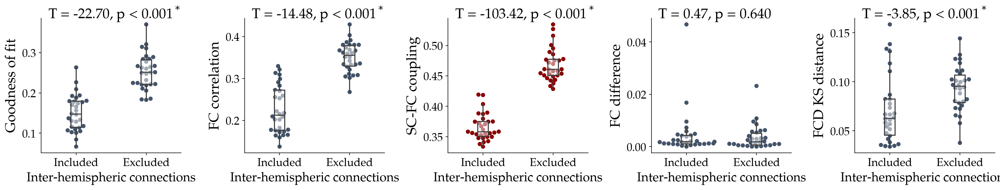

In [187]:
gof_labels = {    
    'gof': 'Goodness of fit',
    'fc_corr': 'FC correlation',
    'sc_fc': 'SC-FC coupling',
    'fc_diff': 'FC difference',
    'fcd_ks': 'FCD KS distance',
}
add_text = True

fig, axd = plt.subplot_mosaic(
    [
        ['gof','fc_corr', 'sc_fc', 'fc_diff', 'fcd_ks'],
    ],
    gridspec_kw=dict(width_ratios=[1]*5, height_ratios=[1]), 
    figsize=(20, 4)
)

for i, (col, label) in enumerate(gof_labels.items()):
    ax = axd[col]
    if col == 'sc_fc':
        color = 'darkred'
    else:
        color= '#44546A'
    sns.swarmplot(
        data=groups_optima_combined,
        x='Inter-hemispheric connections', y=col,
        s=6, color=color,
        ax=ax
    )
    sns.boxplot(
        data=groups_optima_combined,
        x='Inter-hemispheric connections', y=col,
        showfliers=False,
        showcaps=False, width=0.15,
        boxprops={"facecolor": (1, 1, 1, 0.5)},
        ax=ax)
    plt.setp(ax.collections, zorder=0, label="") # puts swarm in the back
    ax.set_ylabel(label, fontsize=20)
    ax.set_xlabel('Inter-hemispheric connections', fontsize=18)
    sns.despine()
    # add statistics
    t, p = scipy.stats.ttest_rel(
        groups_optima_inter.loc[:, col], 
        groups_optima_main.loc[:, col])
    if add_text:
        if p > 0.001:
            text = f'T = {t:.2f}, p = {p:.3f}'
        else:
            text = f'T = {t:.2f}, p < 0.001'
        if p < 0.05:
            text+=r'$^*$'
        text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
        text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
        ax.text(text_x, text_y, 
                text,
                color='black',
                size=20,
                multialignment='left')
    print(label, round(t, 3), round(p,3), sep="\t")
fig.tight_layout(pad=1.0)

In [188]:
groups_optima_inter[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty', 'sc_fc']].describe()

,gof,fc_corr,fc_diff,fcd_ks,fic_penalty,sc_fc
count,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000
mean,0.150195,0.226336,0.004481,0.071660,0.029418,0.366005
std,0.044866,0.056863,0.008674,0.034785,0.013683,0.022035
min,0.066630,0.137866,0.000008,0.033862,0.014648,0.333711
25%,0.114451,0.176756,0.001067,0.045610,0.019275,0.350570
50%,0.147535,0.212528,0.001813,0.062829,0.023476,0.358339
75%,0.179367,0.272145,0.004236,0.082287,0.035623,0.374933
max,0.263536,0.329559,0.046737,0.158537,0.058307,0.419253


In [189]:
(
    groups_optima_inter[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty', 'sc_fc']]
  - groups_optima_main[['gof', 'fc_corr', 'fc_diff', 'fcd_ks', 'fic_penalty', 'sc_fc']]
).describe().round(3)

,gof,fc_corr,fc_diff,fcd_ks,fic_penalty,sc_fc
count,30.000,30.000,30.000,30.000,30.000,30.000
mean,-0.103,-0.124,0.001,-0.022,-0.008,-0.102
std,0.025,0.047,0.010,0.031,0.017,0.005
min,-0.162,-0.202,-0.022,-0.065,-0.036,-0.116
25%,-0.120,-0.150,-0.003,-0.045,-0.022,-0.105
50%,-0.096,-0.132,-0.000,-0.024,-0.008,-0.102
75%,-0.088,-0.104,0.003,-0.007,0.004,-0.099
max,-0.055,-0.038,0.046,0.039,0.022,-0.094


## b. Age effect and its comparison to models excluding inter-hemispheric connections from cost function

In [190]:
I_E_group_inter = pd.DataFrame(index=data_group_inter.index, columns=parcels, dtype=float)
for i, parc in enumerate(parcels):
    for group, row in data_group_inter.iterrows():
        I_E_group_inter.loc[group, parc] = regional_vars_group_inter[group][row['SeedMW']].loc[i, 'I_E']

In [192]:
df = pd.concat([I_E_group_inter, data_group_inter], axis=1)
df.columns = [f'node_{i}' for i in range(100)] + list(df.columns[100:])
df['age'] = df['Age (y)']

t_age_group_inter = pd.Series(index=parcels)
p_age_group_inter = pd.Series(index=parcels)
for i, parc in enumerate(parcels):
    # fit the model
    mod = smf.ols(f'node_{i} ~ age + gof + Fp + mean_rms', data=df)
    res = mod.fit()
    t_age_group_inter.loc[parc] = res.tvalues['age']
    p_age_group_inter.loc[parc] = res.pvalues['age']

# FDR correction
_, p_age_group_inter_fdr = statsmodels.stats.multitest.fdrcorrection(p_age_group_inter)
p_age_group_inter_fdr = pd.Series(p_age_group_inter_fdr, index=parcels)


# display stats of signficant regions
stats_age_group_inter = pd.DataFrame({"t": t_age_group_inter, "p": p_age_group_inter, "p_fdr": p_age_group_inter_fdr})
stats_age_group_inter.to_csv("p_pnc_fc-group_sc-micamics_runs-1_IE_age_inter_stats.csv")
stats_age_group_inter[stats_age_group_inter["p_fdr"] < 0.05].sort_values(by="t").round(3)

,t,p,p_fdr
7Networks_RH_Default_Temp_3,-3.473,0.002,0.019
7Networks_RH_Cont_PFCl_3,-3.368,0.002,0.020
7Networks_LH_Vis_1,-3.140,0.004,0.027
7Networks_RH_Cont_Par_2,-2.974,0.006,0.036
7Networks_LH_Default_PFC_5,-2.914,0.007,0.039
7Networks_RH_Default_Temp_1,-2.871,0.008,0.039
7Networks_RH_DorsAttn_Post_4,2.773,0.010,0.045
7Networks_RH_SomMot_3,2.854,0.009,0.039
7Networks_RH_DorsAttn_Post_2,2.881,0.008,0.039
7Networks_LH_DorsAttn_Post_4,3.000,0.006,0.036


Plot unthresholded (5f):

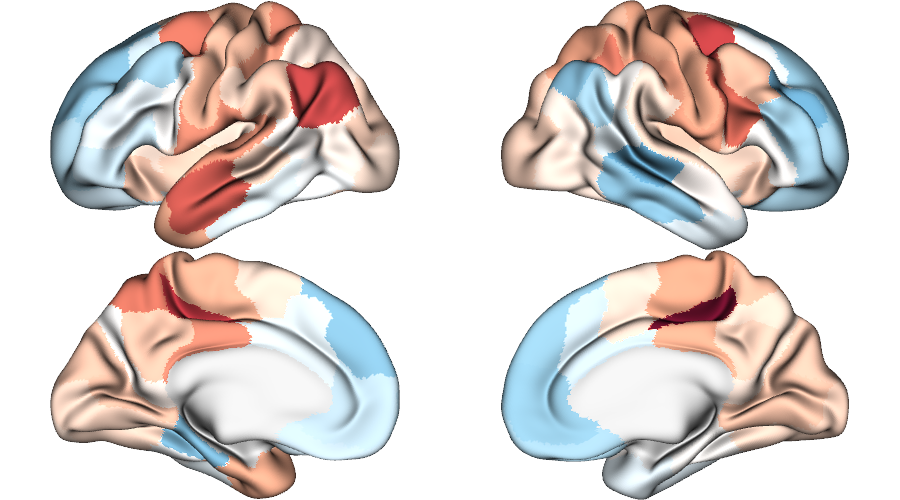

In [195]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_group_inter, 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='grid',
)

Plot FDR-corrected (S12):

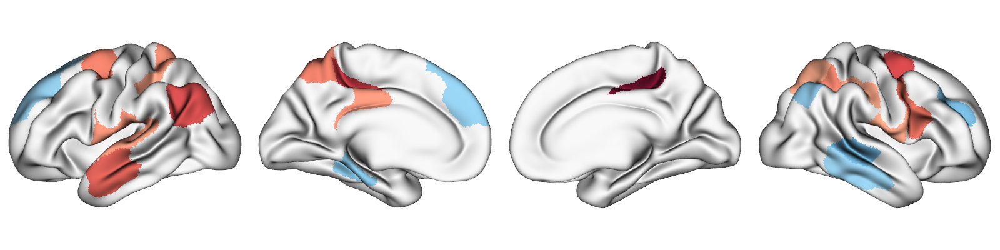

In [193]:
plot.plot_surface(
    transform.deparcellate_surf(t_age_group_inter[p_age_group_inter_fdr<0.05], 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    vrange='sym', cmap='RdBu_r', cbar=False,
    layout_style='row',
)

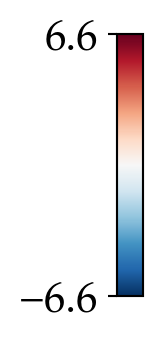

In [196]:
vmin = min(t_age_group_inter.values.min(), -t_age_group_inter.values.max())
vmax = -vmin
plot.plot_colorbar(vmin.round(2), vmax.round(2), 'RdBu_r', figsize=(2, 2));

Spatial correlation with main age effects:

In [197]:
r_aget_group, p_aget_group, _ = stats.spin_test_parcellated(t_age_group_inter.to_frame(), t_age_group.to_frame(), 'schaefer-200', n_perm=1000)
print(
    'Correlation coefficients\n',
    r_aget_group,
    '\nSpin p-values\n',
    p_aget_group
)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Correlation coefficients
           0
0  0.735229 
Spin p-values
      0
0  0.0


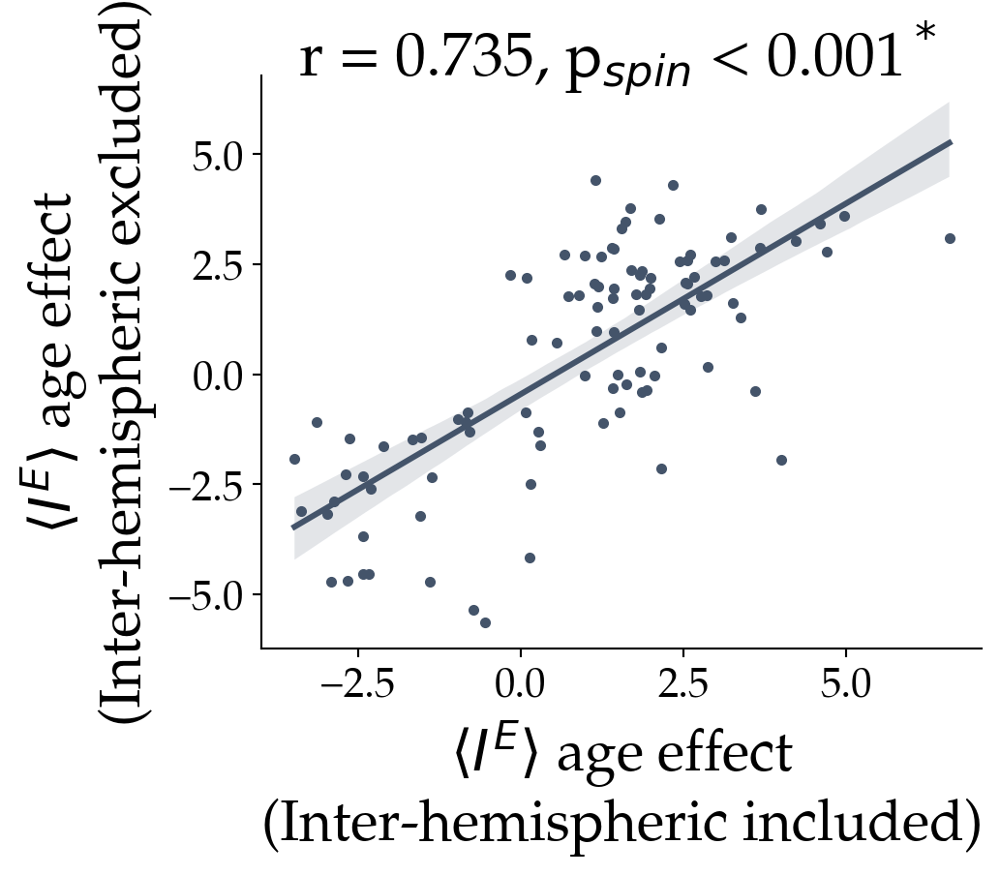

In [198]:
fig, ax = plt.subplots(figsize=(5,4))
sns.regplot(x=t_age_group_inter, y=t_age_group, 
            scatter_kws=dict(color=thcolor, alpha=1, s=10), 
            line_kws=dict(color=thcolor), 
            ax=ax)
r = r_aget_group.values[0,0]
p = p_aget_group.values[0,0]
if p > 0.001:
    text = f'r = {r:.3f}, p = {p:.3f}'
else:
    text = f'r = {r:.3f}, p < 0.001'
if p < 0.05:
    text+=r'$^*$'
text = text.replace('p', r'p$_{spin}$')
text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
ax.text(text_x, text_y, 
        text,
        color='black',
        size=24,
        multialignment='left')
ax.set_xlabel(r'$\langle I^E \rangle$ age effect'
             '\n(Inter-hemispheric included)', 
              fontdict=dict(fontsize=22))
ax.set_ylabel(r'$\langle I^E \rangle$ age effect'
             '\n(Inter-hemispheric excluded)',
             fontdict=dict(fontsize=22))
sns.despine()

# Figure S13. Effect of conduction delay on goodness-of-fit and $\langle I_i^E \rangle$

First run `scripts/modeling/run/cuBNM/delay`.

Load data:

In [199]:
all_v_IE = {}
all_v_fits = {}
vlist = ['v-orig_syncmsec-0', 'v-orig_syncmsec-1', 'v-1', 'v-2', 'v-3', 'v-4', 'v-5', 'v-6']

for v in vlist:
    all_v_IE[v] = pd.DataFrame(index=data.index, columns=parcels)
    all_v_fits[v] = {}
    for sub, row in tqdm(data.iterrows()):
        cmaes_log_path = os.path.join(
            OUTPUT_DIR['pnc'], 'sim', sub, 
            'ctx_parc-schaefer-100_mean001_thresh-1_fic_final',
            '6maps_schaefer-100_zscore', 'cmaes_multimaps_gpu',
            f'ctx_parc-schaefer-100_hemi-LR_highpass-013_lowpass'\
            f'-none_exc-inter_G_0.5-4_wee_0.05-0.75_wei_0.05-0.75_wie_0_'\
            f'het-wee-wei_SeedMW-{row["SeedMW"]}_SeedSim-410_n-81x210.txt')
        base_dir = cmaes_log_path.replace('.txt', '_cuBNM')
        if not os.path.exists(base_dir):
            print(sub, "not found")
            continue
        try:
            sim_data = np.load(os.path.join(base_dir, v, 'it1.npz'), allow_pickle=True)
        except FileNotFoundError:
            print(sub, "not found")
            continue
        all_v_IE[v].loc[sub, :] = sim_data['sim_states'].flatten()[0]['I_E'].squeeze()
        all_v_fits[v][sub] = pd.read_csv(os.path.join(base_dir, v, 'score.csv'), index_col=0).T.iloc[:, 0]
    all_v_fits[v] = pd.DataFrame(all_v_fits[v]).T
    # make the cubnm gof measures comparable to the main results
    all_v_fits[v][['-fc_diff', '-fcd_ks', '-fc_normec', '-fic_penalty']] = -all_v_fits[v][['-fc_diff', '-fcd_ks', '-fc_normec', '-fic_penalty']]
    all_v_fits[v].columns = [s.replace('-','').replace('+','') for s in all_v_fits[v].columns]

752it [00:03, 199.63it/s]
752it [00:02, 252.88it/s]
752it [00:03, 246.69it/s]
752it [00:03, 246.45it/s]
752it [00:03, 247.25it/s]
752it [00:02, 253.35it/s]
752it [00:03, 222.43it/s]
752it [00:03, 244.59it/s]


## a. Goodness-of-fit comparison

gof v-1 -41.876191617611504 1.3081693962941022e-198 -0.030892046663349583 0.020229652567959656
gof v-2 -38.246336917853704 1.8125741431546091e-178 -0.01314592966933438 0.00942562979641067
gof v-3 -34.356063209214696 3.4154992872744603e-156 -0.007612230936630339 0.006075996044392865
gof v-4 -31.074316471313395 5.912351717475232e-137 -0.005199429159602269 0.004588418280465563
gof v-5 -29.184009137494826 9.569334257129889e-126 -0.003841547253260777 0.0036096920029591206
gof v-6 -27.763513016302134 2.737099577139132e-117 -0.003100152876987768 0.003062087614141349
fc_corr v-1 -2.8726504232431216 0.004185220389232107 -0.0003594762451175738 0.0034315974594540696
fc_corr v-2 -3.4093785509992305 0.0006858685103597634 -0.00022164249310949316 0.001782734718132268
fc_corr v-3 2.107686384559907 0.03538897401624248 9.342933632941715e-05 0.0012155874120768264
fc_corr v-4 4.236750208267664 2.5496687485202624e-05 0.0001397689766064859 0.0009046630368679638
fc_corr v-5 4.63965817174615 4.11698559682507e

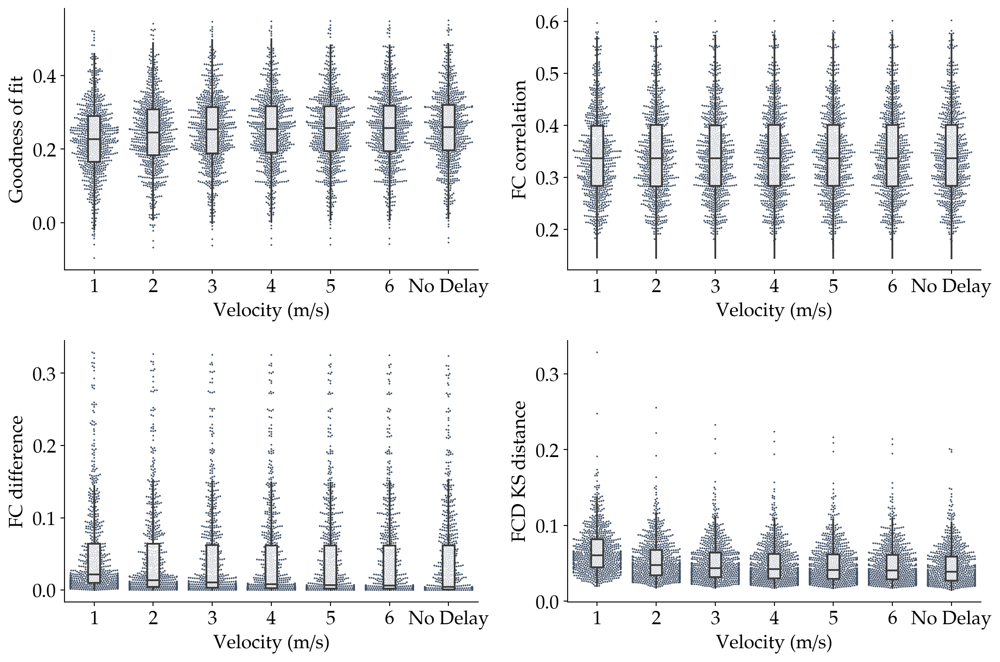

In [200]:
gof_labels = {
    'gof': 'Goodness of fit',
    'fc_corr': 'FC correlation',
    'fc_diff': 'FC difference',
    'fcd_ks': 'FCD KS distance',
}
# exclude syncmsec-0 and sort the velocities >0
vlist_ordered = vlist[1:2] + vlist[-1:1:-1]
vlist_ordered = vlist_ordered[::-1]
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()
for i, (col, label) in enumerate(gof_labels.items()):
    ax = axes[i]
    plot_data = {}
    for v in vlist_ordered:
        plot_data[v] = all_v_fits[v].loc[:, col]
    plot_data = pd.DataFrame(plot_data).unstack().reset_index()
    sns.swarmplot(
        data=plot_data,
        x='level_0', y=0,
        s=1.5, color=thcolor,
        ax=ax
    )
    sns.boxplot(
        data=plot_data,
        x='level_0', y=0,
        showfliers=False,
        showcaps=False, width=0.2,
        boxprops={"facecolor": (1, 1, 1, 0.75)},
        ax=ax)
    plt.setp(ax.collections, zorder=0, label="") # puts swarm in the back
    ax.set_ylabel(label)
    ax.set_xticklabels(list(range(1, 7)) + ['No Delay'])
    ax.set_xlabel('Velocity (m/s)')
    sns.despine()
    # print statistics
    for v in vlist_ordered[:-1]:
        t, p = scipy.stats.ttest_rel(all_v_fits[v].loc[:, col], all_v_fits['v-orig_syncmsec-1'].loc[:, col])
        diff = (all_v_fits[v].loc[:, col] - all_v_fits['v-orig_syncmsec-1'].loc[:, col])
        print(col, v, t, p, diff.mean(), diff.std())
fig.tight_layout(pad=1.0)

## b. Node-level intraclass correlation of $\langle I_i^E \rangle$

In [60]:
icc_v = pd.DataFrame(index=parcels, columns=vlist_ordered[:-1], dtype=float)
for v in tqdm(vlist_ordered[:-1]):
    for i, parc in enumerate(parcels):
        icc_df = pd.DataFrame(index=data.index, columns=[1, 2], dtype=float)
        for sub in data.index:
            icc_df.loc[sub, 'orig'] = all_v_IE['v-orig_syncmsec-1'].loc[sub, parc]
            icc_df.loc[sub, v] = all_v_IE[v].loc[sub, parc]
        icc_v.loc[parc, v] = utils.madicc(icc_df.loc[:, 'orig'], icc_df.loc[:, v])

100%|█████████████████████████████████████████████| 6/6 [01:01<00:00, 10.33s/it]


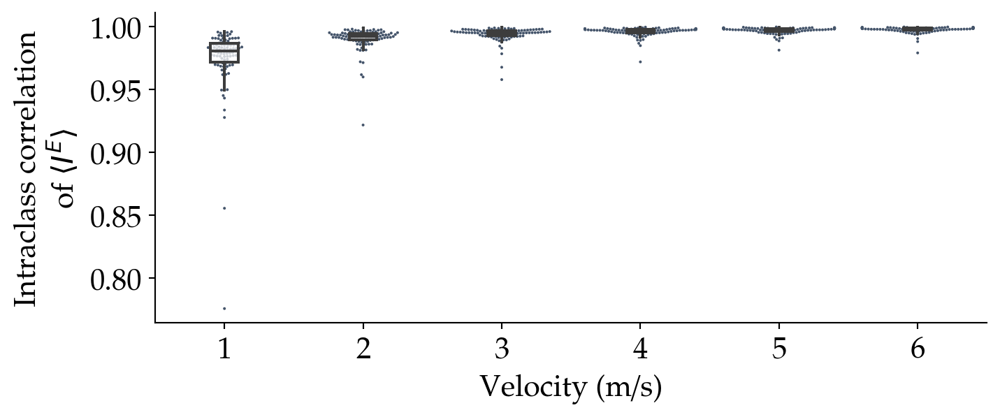

In [61]:
fig, ax = plt.subplots(figsize=(8, 3))
plot_data = icc_v.unstack().reset_index()
sns.swarmplot(
    data=plot_data,
    x='level_0', y=0,
    s=1.5, color=thcolor,
    ax=ax
)
sns.boxplot(
    data=plot_data,
    x='level_0', y=0,
    showfliers=False,
    showcaps=False, width=0.2,
    boxprops={"facecolor": (1, 1, 1, 0.75)},
    ax=ax)
plt.setp(ax.collections, zorder=0, label="") # puts swarm in the back
ax.set_ylabel('Intraclass correlation\n'
              r'of $\langle I^E \rangle$'
             )
ax.set_xticklabels(list(range(1, 7)))
ax.set_xlabel('Velocity (m/s)')
sns.despine()

In [46]:
icc_v.describe().round(3)

,v-1,v-2,v-3,v-4,v-5,v-6
count,100.000,100.000,100.000,100.000,100.000,100.000
mean,0.975,0.990,0.994,0.996,0.997,0.998
std,0.027,0.009,0.006,0.004,0.003,0.003
min,0.776,0.922,0.958,0.972,0.981,0.979
25%,0.971,0.989,0.993,0.995,0.996,0.997
50%,0.981,0.992,0.995,0.997,0.998,0.998
75%,0.987,0.995,0.997,0.998,0.999,0.999
max,0.996,0.999,1.000,1.000,1.000,1.000


# Figure S14. Effect of Gaussian noise random seed on goodness-of-fit and $\langle I_i^E \rangle$

First run `scripts/modeling/run/cuBNM/sim_seed`.

Load the simulation data of alternative seeds:

In [52]:
all_seed_IE = {}
all_seed_fits = {}
for sub, row in tqdm(data.iterrows()):
    cmaes_log_path = os.path.join(
        OUTPUT_DIR['pnc'], 'sim', sub, 
        'ctx_parc-schaefer-100_mean001_thresh-1_fic_final',
        '6maps_schaefer-100_zscore', 'cmaes_multimaps_gpu',
        f'ctx_parc-schaefer-100_hemi-LR_highpass-013_lowpass'\
        f'-none_exc-inter_G_0.5-4_wee_0.05-0.75_wei_0.05-0.75_wie_0_'\
        f'het-wee-wei_SeedMW-{row["SeedMW"]}_SeedSim-410_n-81x210.txt'
    )
    base_dir = cmaes_log_path.replace('.txt', '_cuBNM')
    if not os.path.exists(base_dir):
        print(sub, "not found")
        continue
    sub_IE = pd.DataFrame(index=parcels, columns=list(range(50))+['orig'])
    sub_fits = {}
    orig_sim_data = np.load(os.path.join(base_dir, 'SeedSim-410', 'it1.npz'))
    sub_IE.iloc[:, -1] = orig_sim_data['I_E'].squeeze()
    orig_fit = pd.read_csv(os.path.join(base_dir, 'orig', 'score.csv'), index_col=0).T.iloc[:, 0]
    sub_fits['orig'] = orig_fit
    for rand_seed in range(50):
        seed_sim_data = np.load(os.path.join(base_dir, f'SeedSim-{rand_seed}', 'it1.npz'))
        sub_IE.iloc[:, rand_seed] = seed_sim_data['I_E'].squeeze()
        sub_fits[rand_seed] = pd.read_csv(os.path.join(base_dir, f'SeedSim-{rand_seed}', 'score.csv'), index_col=0).T.iloc[:, 0]
    sub_fits = pd.DataFrame(sub_fits).T
    # make the cubnm gof measures comparable to the main results
    sub_fits[['-fc_diff', '-fcd_ks', '-fc_normec', '-fic_penalty']] = -sub_fits[['-fc_diff', '-fcd_ks', '-fc_normec', '-fic_penalty']]
    sub_fits.columns = [s.replace('-','').replace('+','') for s in sub_fits.columns]
    all_seed_IE[sub] = sub_IE
    all_seed_fits[sub] = sub_fits

752it [06:39,  1.88it/s]


## a. Goodness-of-fit comparison

Calculate the median of their GOF measures:

In [41]:
orig_fits = {}
median_fits = {}
for sub in all_seed_fits.keys():
    orig_fits[sub] = all_seed_fits[sub].iloc[0]
    median_fits[sub] = all_seed_fits[sub].iloc[1:].median()
orig_fits = pd.DataFrame(orig_fits).T
median_fits = pd.DataFrame(median_fits).T

Compare GOF of original seed and alternative seeds:

Goodness of fit	74.751	0.0
FC correlation	18.865	0.0
FC difference	-15.699	0.0
FCD KS distance	-64.684	0.0


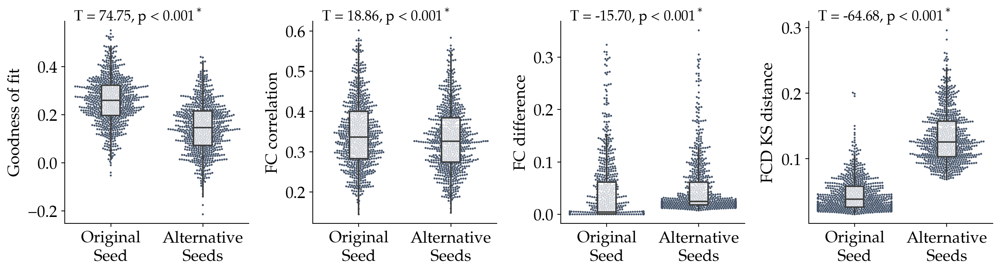

In [42]:
gof_labels = {
    'gof': 'Goodness of fit',
    'fc_corr': 'FC correlation',
    'fc_diff': 'FC difference',
    'fcd_ks': 'FCD KS distance',
}

fig, axes = plt.subplots(1, len(gof_labels), figsize=(14, 4))
for i, (col, label) in enumerate(gof_labels.items()):
    ax = axes[i]
    plot_data = pd.DataFrame({'orig': orig_fits[col], 'alt': median_fits[col]}).unstack().reset_index()
    sns.swarmplot(
        data=plot_data,
        x='level_0', y=0,
        s=2, color=thcolor,
        ax=ax
    )
    sns.boxplot(
        data=plot_data,
        x='level_0', y=0,
        showfliers=False,
        showcaps=False, width=0.2,
        boxprops={"facecolor": (1, 1, 1, 0.75)},
        ax=ax)
    plt.setp(ax.collections, zorder=0, label="") # puts swarm in the back
    ax.set_ylabel(label)
    ax.set_xticklabels(['Original\nSeed', 'Alternative\nSeeds'])
    ax.set_xlabel('')
    sns.despine()
    # add statistics
    t, p = scipy.stats.ttest_rel(orig_fits[col], median_fits[col])
    if add_text:
        if p > 0.001:
            text = f'T = {t:.2f}, p = {p:.3f}'
        else:
            text = f'T = {t:.2f}, p < 0.001'
        if p < 0.05:
            text+=r'$^*$'
        text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
        text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
        ax.text(text_x, text_y, 
                text,
                color='black',
                size=14,
                multialignment='left')
    print(label, round(t, 3), round(p,3), sep="\t")
fig.tight_layout(pad=1.0)

Descriptive statistics:

In [43]:
orig_fits[gof_labels.keys()].describe()

,gof,fc_corr,fc_diff,fcd_ks
count,752.000000,752.000000,7.520000e+02,752.000000
mean,0.258611,0.344164,4.007325e-02,0.045480
std,0.101360,0.085354,6.332202e-02,0.025911
min,-0.053096,0.144415,1.634871e-08,0.015251
25%,0.196954,0.283255,5.097750e-04,0.026174
50%,0.260318,0.336549,4.274061e-03,0.038395
75%,0.322364,0.400317,6.181613e-02,0.057959
max,0.551265,0.601691,3.236341e-01,0.200916


In [44]:
median_fits[gof_labels.keys()].describe()

,gof,fc_corr,fc_diff,fcd_ks
count,752.000000,752.000000,752.000000,752.000000
mean,0.146389,0.332404,0.049802,0.133351
std,0.106406,0.080804,0.055095,0.040246
min,-0.214950,0.148409,0.007497,0.068548
25%,0.071415,0.274188,0.017985,0.103153
50%,0.146458,0.325681,0.024824,0.125916
75%,0.214998,0.384114,0.061418,0.157590
max,0.440606,0.583265,0.351150,0.296037


In [33]:
(median_fits - orig_fits)[gof_labels.keys()].describe()

,gof,fc_corr,fc_diff,fcd_ks
count,752.000000,752.000000,752.000000,752.000000
mean,-0.112222,-0.011761,0.009729,0.087871
std,0.041169,0.017096,0.016994,0.037252
min,-0.260136,-0.072272,-0.031501,0.012929
25%,-0.135927,-0.022409,-0.005911,0.060727
50%,-0.109244,-0.011374,0.015559,0.081507
75%,-0.084402,-0.000840,0.021100,0.108194
max,-0.004475,0.034175,0.069734,0.245671


## b. Node-level intraclass correlation of $\langle I_i^E \rangle$

In [53]:
icc_seed = pd.DataFrame(index=parcels, columns=range(50), dtype=float)
for rand_seed in tqdm(range(50)):
    for i, parc in enumerate(parcels):
        icc_df = pd.DataFrame(index=data.index, columns=[1, 2], dtype=float)
        for sub in all_seed_IE.keys():
            icc_df.loc[sub, 'orig'] = all_seed_IE[sub].loc[parc, 'orig']
            icc_df.loc[sub, rand_seed] = all_seed_IE[sub].loc[parc, rand_seed]
        icc_seed.loc[parc, rand_seed] = utils.madicc(icc_df.loc[:, 'orig'], icc_df.loc[:, rand_seed])

100%|███████████████████████████████████████████| 50/50 [09:34<00:00, 11.50s/it]


In [15]:
icc_seed.describe()

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,0.776419,0.760560,0.759459,0.777678,0.770235,0.706220,0.782597,0.769280,0.695499,0.795221,...,0.759547,0.752269,0.771926,0.738807,0.807898,0.791420,0.753067,0.725681,0.713364,0.774689
std,0.156253,0.196999,0.197466,0.169253,0.154352,0.248078,0.193755,0.191123,0.254649,0.175716,...,0.190402,0.214861,0.194218,0.216805,0.169183,0.155594,0.204175,0.185051,0.208627,0.178911
min,0.300154,0.062522,-0.251839,0.137320,0.128342,-0.359874,-0.204769,0.022313,-0.172224,0.151034,...,-0.086975,-0.136120,0.020272,-0.084537,-0.068580,0.185860,-0.014387,-0.017392,0.024917,0.065286
25%,0.731069,0.696108,0.703439,0.727194,0.702393,0.664971,0.746910,0.745597,0.602278,0.769246,...,0.706467,0.677241,0.699296,0.700082,0.743742,0.709121,0.687891,0.650352,0.649240,0.751567
50%,0.823858,0.827074,0.823576,0.824198,0.808549,0.782629,0.837125,0.831734,0.789732,0.844776,...,0.812979,0.824466,0.833499,0.806733,0.867843,0.841625,0.821165,0.780243,0.790667,0.833759
75%,0.882441,0.895193,0.894769,0.892538,0.884414,0.858750,0.899216,0.878719,0.855008,0.905215,...,0.882583,0.893799,0.899442,0.870880,0.922048,0.907630,0.883688,0.850495,0.842393,0.884012
max,0.946131,0.975286,0.978237,0.959855,0.941863,0.960974,0.979882,0.959050,0.966430,0.973358,...,0.972184,0.961793,0.971236,0.957951,0.975546,0.980306,0.965264,0.928283,0.968355,0.963876


Take median across 50 random seeds

In [55]:
icc_seed_median = icc_seed.median(axis=1)
icc_seed_median.describe()

count    100.000000
mean       0.802112
std        0.100117
min        0.448724
25%        0.769849
50%        0.829039
75%        0.866026
max        0.929146
dtype: float64

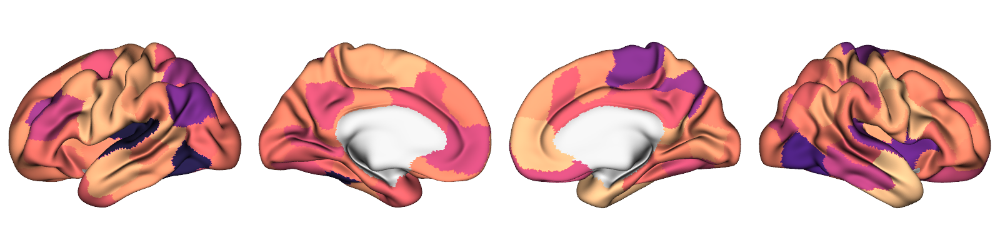

In [22]:
plot.plot_surface(
    transform.deparcellate_surf(icc_seed_median, 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    cmap='magma', cbar=False,
    layout_style='row', vrange=(0.4, 1)
)

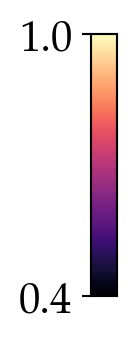

In [18]:
plot.plot_colorbar(0.4, 1.0, 'magma', figsize=(2, 2));

[None, None]

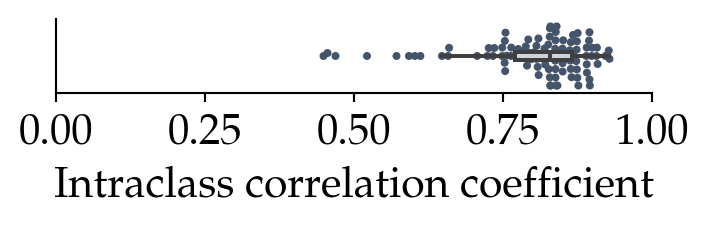

In [23]:
fig, ax = plt.subplots(figsize=(4, 0.5))
sns.swarmplot(
    x=icc_seed_median,
    s=3, color=thcolor,
    ax=ax
)
sns.boxplot(
    x=icc_seed_median,
    showfliers=False,
    showcaps=False, width=0.1,
    boxprops={"facecolor": (1, 1, 1, 0.75)},
    ax=ax)
ax.set_yticks([])
ax.set_xlim([0, 1])
ax.set_xlabel('Intraclass correlation coefficient')
sns.despine()
plt.setp(ax.collections, zorder=0, label="") # puts swarm in the back

# Figure S15. Effect of optimization seeds on goodness-of-fit and $\langle I_i^E \rangle$

## a. Goodness-of-fit comparison

Goodness of fit	-0.013	0.99
FC correlation	-0.819	0.413
FC difference	0.043	0.965
FCD KS distance	-0.834	0.405


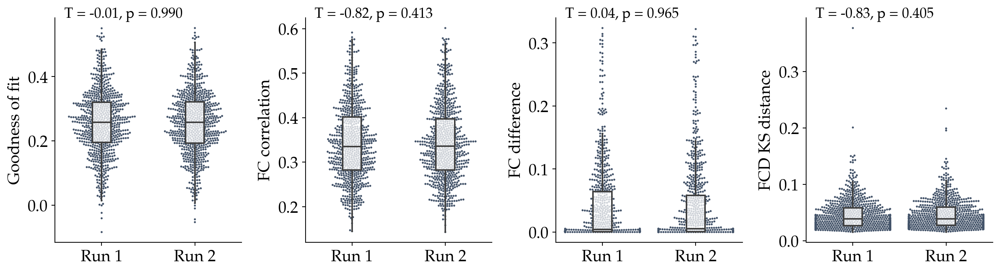

In [201]:
gof_labels = {    
    'gof': 'Goodness of fit',
    'fc_corr': 'FC correlation',
    'fc_diff': 'FC difference',
    'fcd_ks': 'FCD KS distance',
}

fig, axes = plt.subplots(1, len(gof_labels), figsize=(14, 4))
for i, (col, label) in enumerate(gof_labels.items()):
    ax = axes[i]
    sns.swarmplot(
        data=subjects_optima,
        x='SeedMW', y=col,
        s=2, color=thcolor,
        ax=ax
    )
    sns.boxplot(
        data=subjects_optima,
        x='SeedMW', y=col,
        showfliers=False,
        showcaps=False, width=0.2,
        boxprops={"facecolor": (1, 1, 1, 0.75)},
        ax=ax)
    plt.setp(ax.collections, zorder=0, label="") # puts swarm in the back
    ax.set_ylabel(label)
    ax.set_xticklabels(['Run 1', 'Run 2'])
    ax.set_xlabel('')
    sns.despine()
    # add statistics
    t, p = scipy.stats.ttest_rel(
        subjects_optima.loc[subjects_optima['SeedMW']==1, col], 
        subjects_optima.loc[subjects_optima['SeedMW']==2, col])
    if add_text:
        if p > 0.001:
            text = f'T = {t:.2f}, p = {p:.3f}'
        else:
            text = f'T = {t:.2f}, p < 0.001'
        if p < 0.05:
            text+=r'$^*$'
        text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
        text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
        ax.text(text_x, text_y, 
                text,
                color='black',
                size=14,
                multialignment='left')
    print(label, round(t, 3), round(p,3), sep="\t")
fig.tight_layout(pad=1.0)

Descriptive statistics:

In [24]:
subjects_optima.loc[subjects_optima['SeedMW']==1, gof_labels.keys()].describe()

,gof,fc_corr,fc_diff,fcd_ks
count,752.000000,752.000000,752.000000,752.000000
mean,-0.744289,0.342607,0.040891,0.046005
std,0.102277,0.086052,0.063849,0.027900
min,-1.084009,0.144415,0.000002,0.015251
25%,-0.805249,0.282353,0.000573,0.026394
50%,-0.741816,0.334912,0.004104,0.038470
75%,-0.679354,0.401129,0.064432,0.057975
max,-0.449473,0.591618,0.323634,0.377443


In [25]:
subjects_optima.loc[subjects_optima['SeedMW']==2, gof_labels.keys()].describe()

,gof,fc_corr,fc_diff,fcd_ks
count,752.000000,752.000000,7.520000e+02,752.000000
mean,-0.744284,0.342913,4.087359e-02,0.046324
std,0.101516,0.085770,6.333239e-02,0.026245
min,-1.053097,0.142578,5.816863e-07,0.015468
25%,-0.807314,0.282327,6.335432e-04,0.027176
50%,-0.742552,0.336189,5.525088e-03,0.038969
75%,-0.678842,0.397658,5.839137e-02,0.059275
max,-0.448734,0.601691,3.220356e-01,0.234632


In [26]:
(
    subjects_optima.loc[subjects_optima['SeedMW']==1, gof_labels.keys()].reset_index(drop=True)
    - subjects_optima.loc[subjects_optima['SeedMW']==2, gof_labels.keys()].reset_index(drop=True)
).describe()

,gof,fc_corr,fc_diff,fcd_ks
count,752.000000,752.000000,752.000000,752.000000
mean,-0.000005,-0.000306,0.000017,-0.000319
std,0.009709,0.010243,0.010957,0.010483
min,-0.046887,-0.082483,-0.180180,-0.051832
25%,-0.002883,-0.002926,-0.001682,-0.002489
50%,-0.000038,-0.000079,-0.000057,-0.000117
75%,0.003056,0.002512,0.001497,0.002167
max,0.043646,0.075603,0.081428,0.181822


## b. Node-level intraclass correlation of $\langle I_i^E \rangle$

In [43]:
icc_opt = pd.Series(index=parcels, dtype=float)
for i, parc in enumerate(parcels):
    icc_df = pd.DataFrame(index=data.index, columns=[1, 2], dtype=float)
    for sub in data.index:
        for SeedMW in [1, 2]:
            icc_df.loc[sub, SeedMW] = regional_vars[sub][SeedMW].loc[i, 'I_E']
    icc_opt.loc[parc] = utils.madicc(icc_df.iloc[:, 0], icc_df.iloc[:, 1])

In [44]:
icc_opt.describe()

count    100.000000
mean       0.946954
std        0.019292
min        0.852720
25%        0.935535
50%        0.950076
75%        0.959115
max        0.983966
dtype: float64

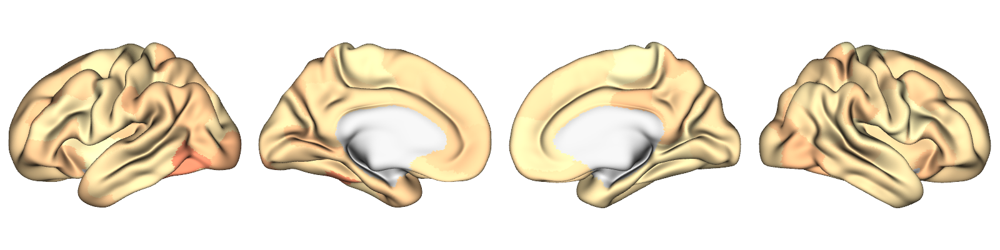

In [29]:
plot.plot_surface(
    transform.deparcellate_surf(icc_opt, 'schaefer-100', concat=True, space='fsaverage'), 
    'fsaverage', mesh_kind='semi-inflated',
    cmap='magma', cbar=False,
    layout_style='row', vrange=(0.4, 1)
)

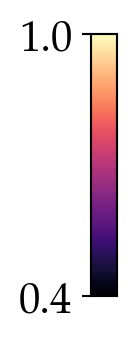

In [13]:
plot.plot_colorbar(0.4, 1, 'magma', figsize=(2, 2));

[None, None]

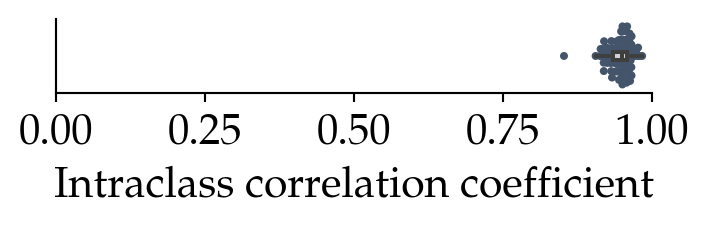

In [32]:
fig, ax = plt.subplots(figsize=(4, 0.5))
sns.swarmplot(
    x=icc_opt,
    s=3, color=thcolor,
    ax=ax
)
sns.boxplot(
    x=icc_opt,
    showfliers=False,
    showcaps=False, width=0.1,
    boxprops={"facecolor": (1, 1, 1, 0.75)},
    ax=ax)
ax.set_yticks([])
ax.set_xlim([0, 1])
ax.set_xlabel('Intraclass correlation coefficient')
sns.despine()
plt.setp(ax.collections, zorder=0, label="") # puts swarm in the back